
# Exploratory Data Analyses of Covid Data (15/08/2020)


The COVID‑19 pandemic, also known as the coronavirus pandemic, is an ongoing global pandemic of coronavirus disease 2019 (COVID‑19), caused by severe acute respiratory syndrome coronavirus 2 (SARS‑CoV‑2). The outbreak was first identified in December 2019 in Wuhan, China. The World Health Organization declared the outbreak a Public Health Emergency of International Concern on 30 January 2020 and a pandemic on 11 March. As of 14 August 2020, more than 21 million cases of COVID‑19 have been reported in more than 188 countries and territories, resulting in more than 761,000 deaths; more than 13 million people have recovered.

In this notebook I focus on analyzing covid data obtained from the [our world in data](https://ourworldindata.org/coronavirus-source-data) and [world o meters](https://www.worldometers.info/coronavirus/) websites, in an effort to better understand the main factors that drive the spread of Covid.

In [1]:
import pandas as pd

import sys

import csv

import matplotlib.pyplot as plt

import numpy as np

import seaborn as sns

import plotly

import plotly.express as px

import bokeh

from datetime import date,datetime, timedelta

import dateutil.relativedelta

from matplotlib import dates as mpl_dates

from matplotlib.animation import FuncAnimation

import random

In [2]:
pd.set_option("display.max_columns", 110)
pd.set_option("display.max_rows", 100)

In [3]:
df = pd.read_csv("owid-covid-data.csv", parse_dates=True)

In [4]:
df.shape

(36774, 36)

In [5]:
df.head()

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,total_deaths_per_million,new_deaths_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,tests_per_case,positive_rate,tests_units,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy
0,AFG,Asia,Afghanistan,2019-12-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83
1,AFG,Asia,Afghanistan,2020-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83
2,AFG,Asia,Afghanistan,2020-01-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83
3,AFG,Asia,Afghanistan,2020-01-03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83
4,AFG,Asia,Afghanistan,2020-01-04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83


In [6]:
df["date"] = pd.to_datetime(df["date"], format="%Y-%m-%d") 

In [7]:
df["perc_death/cases"] = (df["total_deaths"]/df["total_cases"])*100

In [8]:
df.isna().sum()

iso_code                              64
continent                            292
location                               0
date                                   0
total_cases                          352
new_cases                            352
total_deaths                         352
new_deaths                           352
total_cases_per_million              416
new_cases_per_million                416
total_deaths_per_million             416
new_deaths_per_million               416
new_tests                          25168
total_tests                        24824
total_tests_per_thousand           24824
new_tests_per_thousand             25168
new_tests_smoothed                 23706
new_tests_smoothed_per_thousand    23706
tests_per_case                     24568
positive_rate                      24219
tests_units                        22958
stringency_index                    6118
population                            64
population_density                  1683
median_age      

In [9]:
df.loc[df["perc_death/cases"].isnull(),"perc_death/cases"] = 0

In [10]:
df.describe()

,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,total_deaths_per_million,new_deaths_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,tests_per_case,positive_rate,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,perc_death/cases
count,3.642200e+04,36422.000000,36422.000000,36422.000000,36358.000000,36358.000000,36358.000000,36358.000000,11606.000000,1.195000e+04,11950.000000,11606.000000,13068.000000,13068.000000,12206.000000,12555.000000,30656.000000,3.671000e+04,35091.000000,33047.000000,32563.000000,32876.000000,32633.000000,21824.000000,33065.000000,34189.000000,26139.000000,25821.000000,15236.000000,29999.000000,36260.000000,36774.000000
mean,6.282759e+04,1147.700675,3035.494838,41.697765,1287.524582,19.603917,45.369056,0.544464,18589.807513,9.784132e+05,38.412379,0.628030,17587.523799,0.600017,204.856388,0.063409,58.353586,9.257246e+07,363.041250,31.535174,9.391468,5.949272,21347.229922,11.694804,250.080347,8.041005,10.942938,32.628271,52.966141,3.135198,74.172490,2.975948
std,6.457946e+05,10629.434879,28602.176274,359.712373,2993.682096,65.029028,128.753516,2.984342,68772.711136,3.953640e+06,69.744218,1.138578,62711.753917,1.013991,1048.640896,0.091543,28.739633,6.298178e+08,1661.239323,9.019573,6.359498,4.348897,20630.650665,18.898679,117.791163,4.128024,10.497689,13.352126,31.512826,2.540788,7.336049,4.361190
min,0.000000e+00,-2461.000000,0.000000,-1918.000000,0.000000,-265.189000,0.000000,-41.023000,-3743.000000,1.000000e+00,0.000000,-0.398000,0.000000,0.000000,1.535000,0.000000,0.000000,8.090000e+02,0.137000,15.100000,1.144000,0.526000,661.240000,0.100000,79.370000,0.990000,0.100000,7.700000,1.188000,0.100000,53.280000,0.000000
25%,2.500000e+01,0.000000,0.000000,0.000000,12.073000,0.000000,0.000000,0.000000,882.250000,3.353400e+04,2.026250,0.058000,996.750000,0.060000,12.028750,0.007000,39.810000,1.701583e+06,39.497000,24.300000,3.607000,2.155000,5819.495000,0.500000,153.507000,5.310000,1.900000,21.400000,22.863000,1.380000,70.260000,0.000000
50%,6.020000e+02,7.000000,10.000000,0.000000,199.973000,0.972500,2.850000,0.000000,3052.000000,1.397620e+05,11.191000,0.264000,3386.500000,0.278000,35.000000,0.027000,66.670000,8.655541e+06,88.125000,31.600000,7.104000,4.455000,14600.861000,1.800000,237.372000,7.110000,6.434000,31.400000,55.182000,2.540000,75.800000,1.660697
75%,6.704750e+03,120.000000,130.000000,2.000000,1159.243000,12.256000,26.221000,0.160000,10528.500000,5.398170e+05,46.515750,0.756750,11019.750000,0.747000,123.008250,0.081000,80.560000,3.125544e+07,222.873000,39.750000,14.799000,9.720000,32605.906000,15.000000,318.949000,10.180000,19.600000,40.900000,83.741000,4.210000,80.070000,4.162562
max,2.090078e+07,298086.000000,759358.000000,10504.000000,39666.303000,4944.376000,1237.551000,200.040000,926876.000000,6.461203e+07,727.419000,22.359000,822470.000000,15.820000,47299.000000,0.651000,100.000000,7.794799e+09,19347.500000,48.200000,27.049000,18.493000,116935.600000,77.600000,724.417000,23.360000,44.000000,78.100000,98.999000,13.800000,86.750000,100.000000


Lets use some histograms, boxplots and corr plots to get a feel of the data

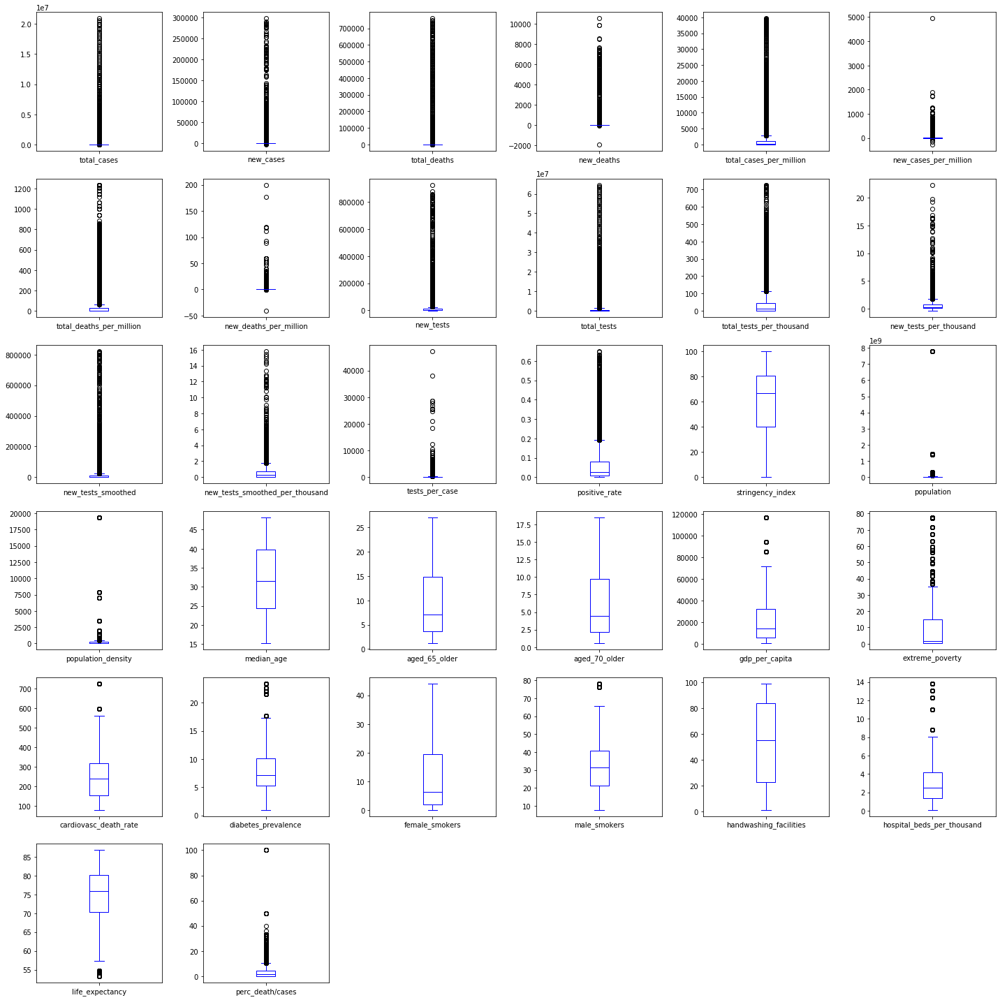

In [11]:
df.plot(kind='box', subplots=True, layout=(6,6), sharex=False, sharey=False, figsize=(20,20), color="b")
plt.tight_layout()
plt.show()

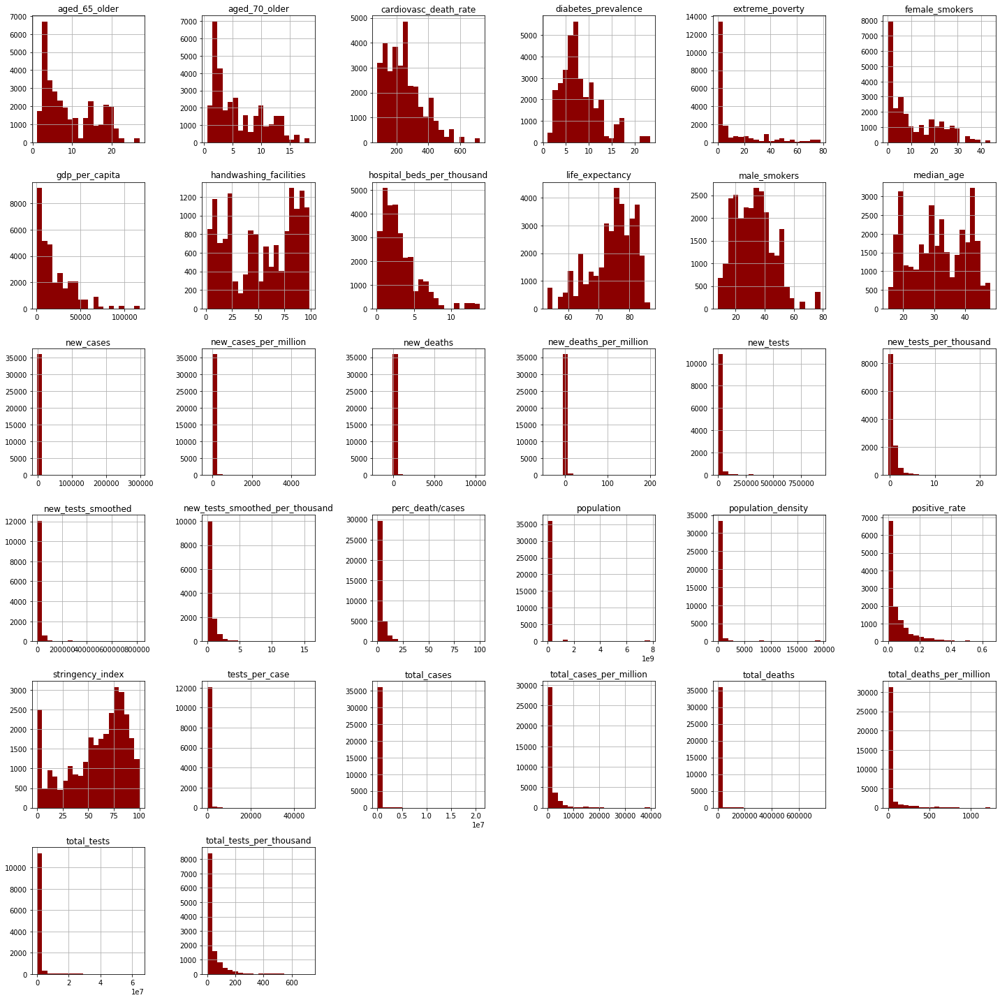

In [12]:
plt.rcParams["figure.figsize"] = (20,20)
df.hist(color="darkred", bins=20)
plt.rcParams["figure.figsize"] = (30,30)
plt.tight_layout()
# plt.savefig("hist.png")
plt.show()

For example, we can see there is an important difference in the percentage of male smokers vs female smokers which partially explain why men may be more susceptible to coronavirus

Variable correlation

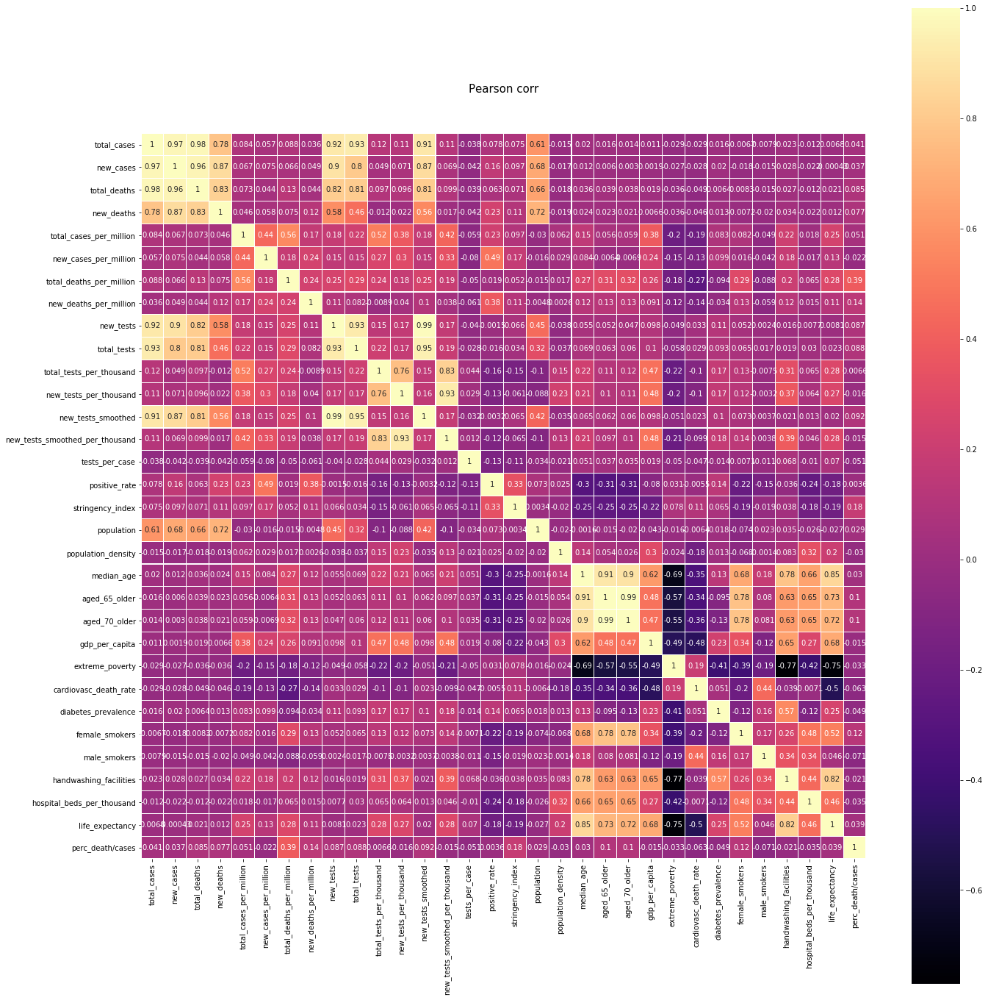

In [13]:
colormap=plt.cm.magma
f, ax = plt.subplots(figsize=(20,20))
plt.title("Pearson corr", y=1.05, size=15)
ax = sns.heatmap(df.corr(), linewidths=0.1, vmax=1.0, square=True, cmap=colormap, linecolor="white", annot=True)
plt.tight_layout()
# plt.savefig("corr_all.png")
plt.show()

As expected, population correlates with both the total amount of cases (0.6) and deaths (0.63), but interestingly, neither correlate with population density(-0.016 and -0.017 respectively).

Furthermore, richer countries seem to be testing more since as we can see, the gdp correlates (0.47) with the total amount of tests per 1000. This, together with the fact that ritcher countries have older population (0.62 corr between gdp and median_age) may explain why there is a slight correlation with the total deaths per million with the gpd per capita (0.26).

We can also observe that interestingly, handwashing facilities highly correlates with the life expectancy (0.82).


In [14]:
list_top_ten_cases = df.sort_values("total_cases", ascending=False)["location"].unique()[1:11]
list_top_ten_deaths = df.sort_values("total_deaths", ascending=False)["location"].unique()[1:11]
list_continents = df["continent"].unique()[:-1]
list_top_five_cases = df.sort_values("total_cases", ascending=False)["location"].unique()[1:6]
list_top_five_deaths = df.sort_values("total_deaths", ascending=False)["location"].unique()[1:6]
list_top_ten_testing_most = df.sort_values("total_tests_per_thousand", ascending=False)["location"].unique()[1:11]
list_top_five_currently_worst = df.loc[df["date"]==df["date"].max()].sort_values("new_cases", ascending=False)["location"].unique()[1:6]

In [15]:
filt1=df["location"].isin(list_top_ten_cases)
filt2=df["location"].isin(list_top_ten_deaths)

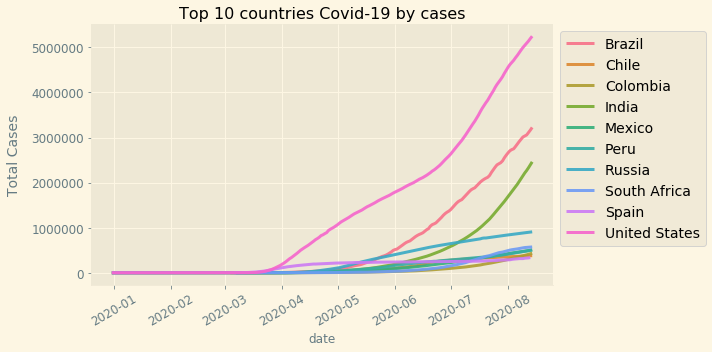

In [16]:
plt.rcParams["figure.figsize"] = (8,5)
plt.style.use("Solarize_Light2")
g=sns.FacetGrid(df.loc[filt1], hue="location", height=5, aspect=2)
g=g.map(plt.plot, "date", "total_cases", linewidth=3, linestyle="-", alpha=0.9)
plt.legend(scatterpoints=1, bbox_to_anchor=(1, 1), loc= "best", fontsize=14,  ncol=1)
plt.title("Top 10 countries Covid-19 by cases", fontsize=16)
plt.ylabel("Total Cases", labelpad=10, fontsize=14)
plt.xticks(rotation="30", fontsize=12)
plt.yticks(rotation="horizontal", fontsize=12)
plt.tight_layout()
# plt.savefig("lines_top10_cases.png")


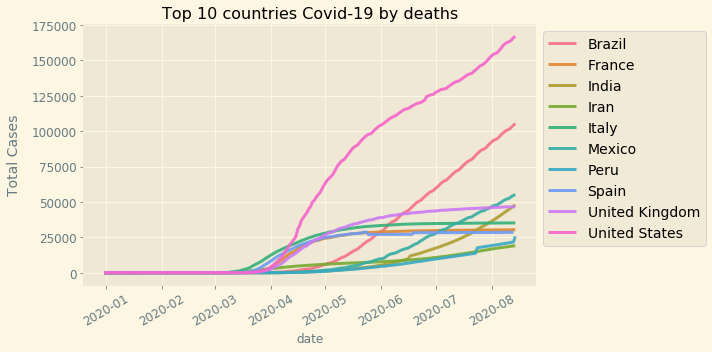

In [17]:
g=sns.FacetGrid(df.loc[filt2], hue="location", height=5, aspect=2)
g=g.map(plt.plot, "date", "total_deaths", linewidth=3, linestyle="-", alpha=0.9)
plt.legend(scatterpoints=1, bbox_to_anchor=(1, 1), loc= "best", fontsize=14,  ncol=1)
plt.title("Top 10 countries Covid-19 by deaths", fontsize=16)
plt.ylabel("Total Cases", labelpad=10, fontsize=14)
plt.xticks(rotation="30", fontsize=12)
plt.yticks(rotation="horizontal", fontsize=12)
plt.tight_layout()
# plt.savefig("lines_top10_deaths.png")

Lets take a global look at the pandemia by looking at the data for each continent. For this purpose I wull use a pivot table grouping the data from all countries from each continent

In [18]:
pivot_continent = pd.pivot_table(df, index=["date", "continent"], values=["total_cases","total_deaths","total_cases_per_million","new_cases", "new_deaths","new_cases_per_million", "total_deaths_per_million","new_tests", "new_tests_per_thousand"], aggfunc=["sum","mean"]).reset_index()

In [19]:
pivot_continent.columns

MultiIndex([(     'date',                         ''),
            ('continent',                         ''),
            (      'sum',                'new_cases'),
            (      'sum',    'new_cases_per_million'),
            (      'sum',               'new_deaths'),
            (      'sum',                'new_tests'),
            (      'sum',   'new_tests_per_thousand'),
            (      'sum',              'total_cases'),
            (      'sum',  'total_cases_per_million'),
            (      'sum',             'total_deaths'),
            (      'sum', 'total_deaths_per_million'),
            (     'mean',                'new_cases'),
            (     'mean',    'new_cases_per_million'),
            (     'mean',               'new_deaths'),
            (     'mean',                'new_tests'),
            (     'mean',   'new_tests_per_thousand'),
            (     'mean',              'total_cases'),
            (     'mean',  'total_cases_per_million'),
          

In [20]:
pivot_country = pd.pivot_table(df, index=["date", "location"], values=["total_cases","total_deaths","total_cases_per_million","total_deaths_per_million", "total_tests","new_cases", "new_deaths", "new_cases_per_million", "total_deaths_per_million"]).reset_index()

In [21]:
pivot_continent.columns = ["date", "continent","new_cases_sum","new_cases_per_million_sum","new_deaths_sum",'new_tests_sum', 'new_tests_per_thousand_sum',"total_cases_sum", "total_cases_per_million_sum", "total_deaths_sum","total_deaths_per_million_sum","new_cases_mean","new_cases_per_million_mean","new_deaths_mean", 'new_tests_mean', 'new_tests_per_thousand_mean', "total_cases_mean", "total_cases_per_million_mean", "total_deaths_mean","total_deaths_per_million_mean"]

In [22]:
pivot_continent.tail()

,date,continent,new_cases_sum,new_cases_per_million_sum,new_deaths_sum,new_tests_sum,new_tests_per_thousand_sum,total_cases_sum,total_cases_per_million_sum,total_deaths_sum,total_deaths_per_million_sum,new_cases_mean,new_cases_per_million_mean,new_deaths_mean,new_tests_mean,new_tests_per_thousand_mean,total_cases_mean,total_cases_per_million_mean,total_deaths_mean,total_deaths_per_million_mean
1363,2020-08-14,Asia,91067.0,1678.869,1509.0,23745.0,0.107,5399479.0,202795.163,115546.0,1964.754,1979.717391,36.497152,32.804348,23745.0,0.1070,117379.978261,4408.590500,2511.869565,42.712043
1364,2020-08-14,Europe,18648.0,2160.894,333.0,34111.0,4.474,2761152.0,225405.875,178997.0,9727.582,372.960000,43.217880,6.660000,6822.2,0.8948,55223.040000,4508.117500,3579.940000,194.551640
1365,2020-08-14,North America,64727.0,3731.315,1832.0,54022.0,1.431,6239663.0,120590.590,240036.0,3357.634,1797.972222,103.647639,50.888889,54022.0,1.4310,173323.972222,3349.738611,6667.666667,93.267611
1366,2020-08-14,Oceania,285.0,217.031,9.0,0.0,0.000,24606.0,5488.616,394.0,84.542,35.625000,27.128875,1.125000,NaN,NaN,3075.750000,686.077000,49.250000,10.567750
1367,2020-08-14,South America,93364.0,1423.832,5800.0,0.0,0.000,5052258.0,90535.977,171093.0,3004.864,7181.846154,109.525538,446.153846,NaN,NaN,388635.230769,6964.305923,13161.000000,231.143385


How many cases there are in each continent?

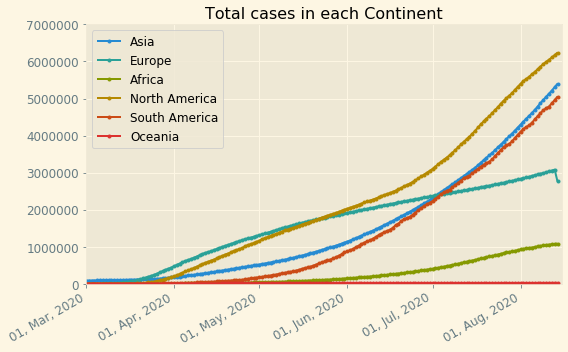

In [23]:
plt.rcParams["figure.figsize"] = (8,5)
plt.style.use("Solarize_Light2")
[(plt.plot_date(pivot_continent.loc[(pivot_continent["continent"] == i)]["date"], pivot_continent.loc[(pivot_continent["continent"] == i)]["total_cases_sum"], markersize=3, linewidth=2, linestyle='-')) for i in (list_continents)]
plt.gcf().autofmt_xdate() # gcf (get current figure)
date_format = mpl_dates.DateFormatter("%d, %b, %Y")
plt.gca().xaxis.set_major_formatter(date_format)
plt.legend(list_continents, scatterpoints=1, loc= "upper left", fontsize=12,  ncol=1)
plt.title("Total cases in each Continent", fontsize=16)
plt.xticks(rotation="30", fontsize=12)
plt.yticks(rotation="horizontal", fontsize=12)
tstart = datetime(2020,3,1)
tend = datetime.now()
plt.xlim([tstart, tend])
plt.ylim(0, 7000000)
plt.tight_layout()
# plt.savefig("lines_total_cases_continents.png")

What are the average in the new cases being reported in each continent per million

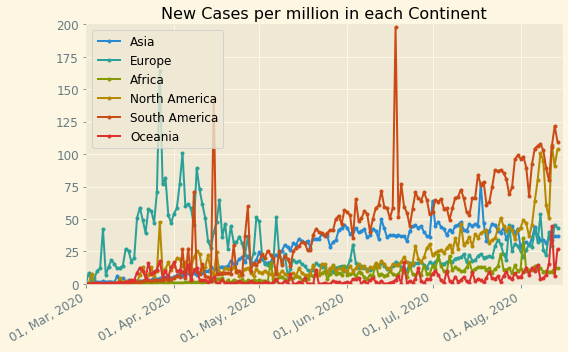

In [24]:
[(plt.plot_date(pivot_continent.loc[pivot_continent["continent"] == i]["date"], pivot_continent.loc[pivot_continent["continent"] == i]["new_cases_per_million_mean"], markersize=3, linewidth=2, linestyle='-')) for i in (list_continents)]
plt.gcf().autofmt_xdate() # gcf (get current figure)
date_format = mpl_dates.DateFormatter("%d, %b, %Y")
plt.gca().xaxis.set_major_formatter(date_format)
plt.legend(list_continents, scatterpoints=1, loc= "upper left", fontsize=12,  ncol=1)
plt.title("New Cases per million in each Continent", fontsize=16)
plt.xticks(rotation="30", fontsize=12)
plt.yticks(rotation="horizontal", fontsize=12)
tstart = datetime(2020,3,1)
tend = datetime.now()
plt.xlim([tstart, tend])
plt.ylim(0, 200)
plt.tight_layout()
# plt.savefig("lines_cases_per_million_continents.png")

What is the amount of tests being performed in each continent

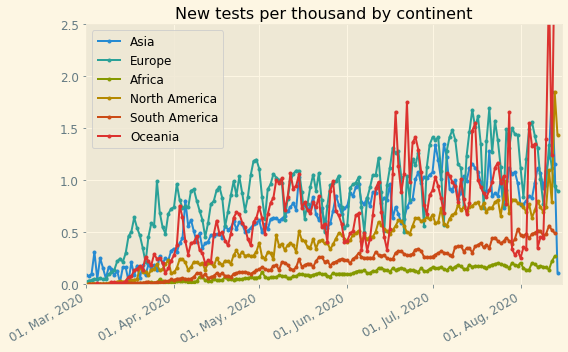

In [25]:
plt.rcParams["figure.figsize"] = (8,5)
[(plt.plot_date(pivot_continent.loc[pivot_continent["continent"] == i]["date"], pivot_continent.loc[pivot_continent["continent"] == i]["new_tests_per_thousand_mean"], markersize=3, linewidth=2, linestyle='-')) for i in (list_continents)]
plt.gcf().autofmt_xdate() # gcf (get current figure)
date_format = mpl_dates.DateFormatter("%d, %b, %Y")
plt.gca().xaxis.set_major_formatter(date_format)
plt.legend(list_continents, scatterpoints=1, loc= "upper left", fontsize=12,  ncol=1)
plt.title("New tests per thousand by continent", fontsize=16)
plt.xticks(rotation="30", fontsize=12)
plt.yticks(rotation="horizontal", fontsize=12)
tstart = datetime(2020,3,1)
tend = datetime.now()
plt.xlim([tstart, tend])
plt.ylim(0, 2.5)
plt.tight_layout()
# plt.savefig("new_tests_per_1000_continents.png")

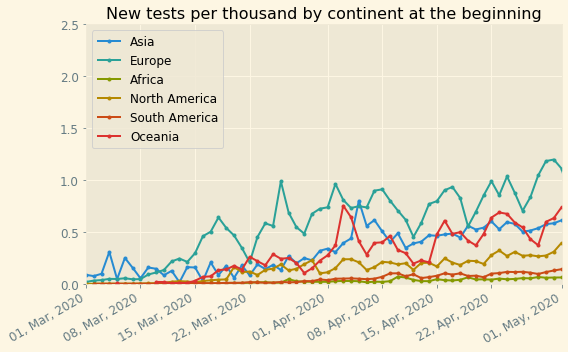

In [26]:
plt.rcParams["figure.figsize"] = (8,5)
[(plt.plot_date(pivot_continent.loc[pivot_continent["continent"] == i]["date"], pivot_continent.loc[pivot_continent["continent"] == i]["new_tests_per_thousand_mean"], markersize=3, linewidth=2, linestyle='-')) for i in (list_continents)]
plt.gcf().autofmt_xdate() # gcf (get current figure)
date_format = mpl_dates.DateFormatter("%d, %b, %Y")
plt.gca().xaxis.set_major_formatter(date_format)
plt.legend(list_continents, scatterpoints=1, loc= "upper left", fontsize=12,  ncol=1)
plt.title("New tests per thousand by continent at the beginning", fontsize=16)
plt.xticks(rotation="30", fontsize=12)
plt.yticks(rotation="horizontal", fontsize=12)
tstart = datetime(2020,3,1)
tend = datetime(2020,5,1)
plt.xlim([tstart, tend])
plt.ylim(0, 2.5)
plt.tight_layout()
# plt.savefig("New_tests_per_thousand_by_continent_beginning.png")

We can observe a low proportion of tests being done in Africa and South America. And Asia and Europe scaled-up the testing quickly, which may explain the lower impact of covid in these continents.

What about the number of deaths in each continent?

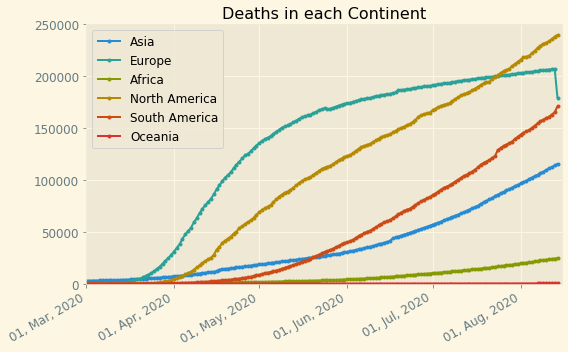

In [27]:
[(plt.plot_date(pivot_continent.loc[pivot_continent["continent"] == i]["date"], pivot_continent.loc[pivot_continent["continent"] == i]["total_deaths_sum"], markersize=3, linewidth=2, linestyle='-')) for i in (list_continents)]
plt.gcf().autofmt_xdate() # gcf (get current figure)
date_format = mpl_dates.DateFormatter("%d, %b, %Y")
plt.gca().xaxis.set_major_formatter(date_format)
plt.legend(list_continents, scatterpoints=1, loc= "upper left", fontsize=12,  ncol=1)
plt.title("Deaths in each Continent", fontsize=16)
plt.xticks(rotation="30", fontsize=12)
plt.yticks(rotation="horizontal", fontsize=12)
tstart = datetime(2020,3,1)
tend = datetime.now()
plt.xlim([tstart, tend])
plt.ylim(0, 250000)
plt.tight_layout()
# plt.savefig("lines_total_deaths_continents.png")

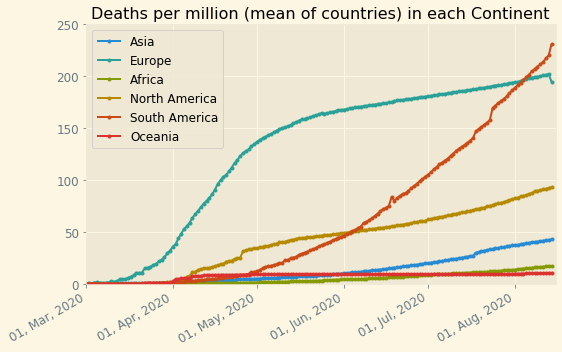

In [28]:
[(plt.plot_date(pivot_continent.loc[pivot_continent["continent"] == i]["date"], pivot_continent.loc[pivot_continent["continent"] == i]["total_deaths_per_million_mean"], markersize=3, linewidth=2, linestyle='-')) for i in (list_continents)]
plt.gcf().autofmt_xdate() # gcf (get current figure)
date_format = mpl_dates.DateFormatter("%d, %b, %Y")
plt.gca().xaxis.set_major_formatter(date_format)
plt.legend(list_continents, scatterpoints=1, loc= "upper left", fontsize=12,  ncol=1)
plt.title("Deaths per million (mean of countries) in each Continent", fontsize=16)
plt.xticks(rotation="30", fontsize=12)
plt.yticks(rotation="horizontal", fontsize=12)
tstart = datetime(2020,3,1)
tend = datetime.now()
plt.xlim([tstart, tend])
plt.ylim(0, 250)
plt.tight_layout()
# plt.savefig("lines_total_deaths_continents_per_million.png")


Next, lets look at the daily recorded cases and deaths in the most affected countries to see how the spread of the virus has progressed so far

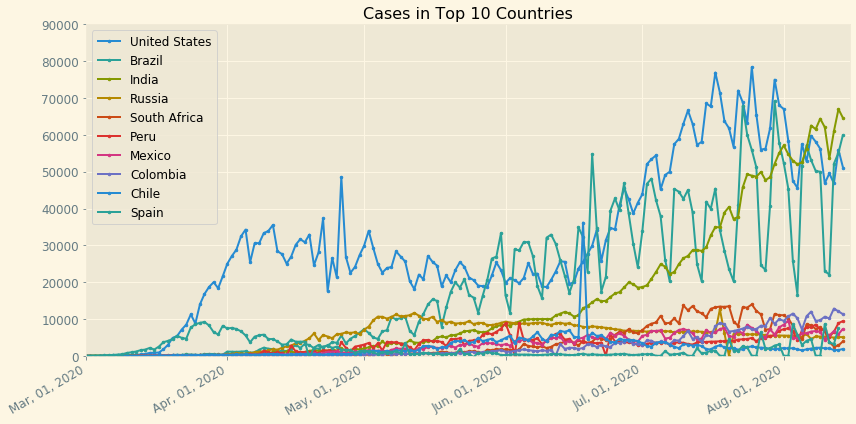

In [29]:
plt.rcParams["figure.figsize"] = (12,6)

[(plt.plot_date(df.loc[df["location"] == i]["date"], df.loc[df["location"] == i]["new_cases"], markersize=2.5, linewidth=2, linestyle='-')) for i in (list_top_ten_cases)]
plt.gcf().autofmt_xdate() # gcf (get current figure)
date_format = mpl_dates.DateFormatter("%b, %d, %Y")
plt.gca().xaxis.set_major_formatter(date_format)
plt.legend(list_top_ten_cases, scatterpoints=1, loc= "upper left", fontsize=12,  ncol=1)
plt.title("Cases in Top 10 Countries", fontsize=16)
plt.xticks(rotation="30", fontsize=12)
plt.yticks(rotation="horizontal", fontsize=12)
tstart = datetime(2020,3,1)
tend = datetime.now()
plt.xlim([tstart, tend])
plt.ylim(0, 90000)
plt.tight_layout()
# plt.savefig("daily_cases_top10_affected_countries.png")


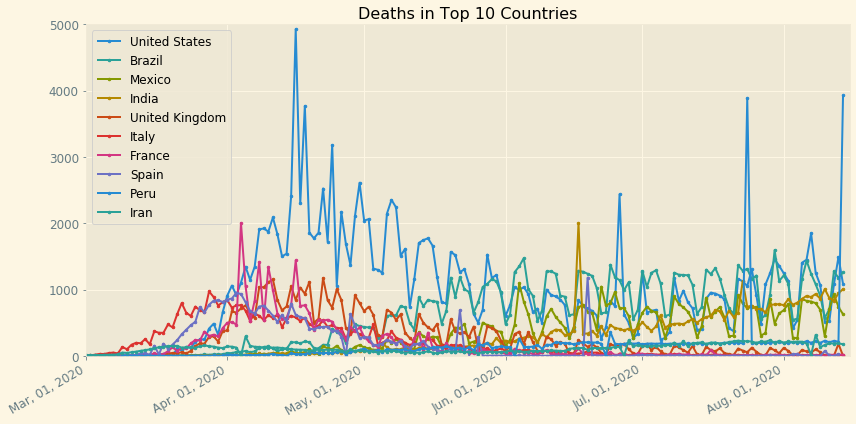

In [30]:
[(plt.plot_date(df.loc[df["location"] == i]["date"], df.loc[df["location"] == i]["new_deaths"], markersize=2.5, linewidth=2, linestyle='-')) for i in (list_top_ten_deaths)]
plt.gcf().autofmt_xdate() # gcf (get current figure)
date_format = mpl_dates.DateFormatter("%b, %d, %Y")
plt.gca().xaxis.set_major_formatter(date_format)
plt.legend(list_top_ten_deaths, scatterpoints=1, loc= "upper left", fontsize=12,  ncol=1)
plt.title("Deaths in Top 10 Countries", fontsize=16)
plt.xticks(rotation="30", fontsize=12)
plt.yticks(rotation="horizontal", fontsize=12)
tstart = datetime(2020,3,1)
tend = datetime.now()
plt.xlim([tstart, tend])
plt.ylim(0, 5000)
plt.tight_layout()

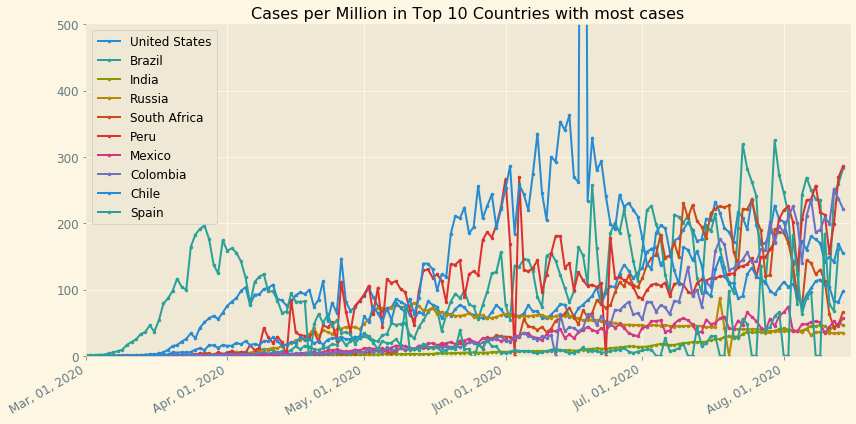

In [31]:
[(plt.plot_date(df.loc[df["location"] == i]["date"], df.loc[df["location"] == i]["new_cases_per_million"], markersize=2.5, linewidth=2, linestyle='-')) for i in (list_top_ten_cases)]
plt.gcf().autofmt_xdate() # gcf (get current figure)
date_format = mpl_dates.DateFormatter("%b, %d, %Y")
plt.gca().xaxis.set_major_formatter(date_format)
plt.legend(list_top_ten_cases, scatterpoints=1, loc= "upper left", fontsize=12,  ncol=1)
plt.title("Cases per Million in Top 10 Countries with most cases", fontsize=16)
plt.xticks(rotation="30", fontsize=12)
plt.yticks(rotation="horizontal", fontsize=12)
tstart = datetime(2020,3,1)
tend = datetime.now()
plt.xlim([tstart, tend])
plt.ylim(0, 500)
plt.tight_layout()

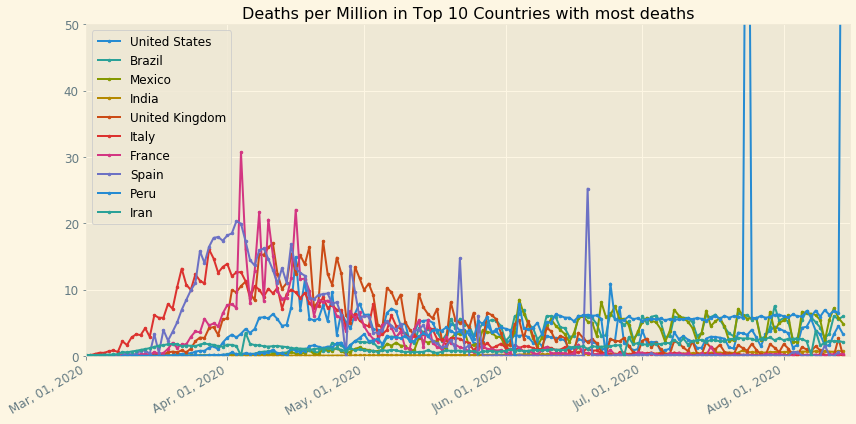

In [32]:
[(plt.plot_date(df.loc[df["location"] == i]["date"], df.loc[df["location"] == i]["new_deaths_per_million"], markersize=2.5, linewidth=2, linestyle='-')) for i in (list_top_ten_deaths)]
plt.gcf().autofmt_xdate() # gcf (get current figure)
date_format = mpl_dates.DateFormatter("%b, %d, %Y")
plt.gca().xaxis.set_major_formatter(date_format)
plt.legend(list_top_ten_deaths, scatterpoints=1, loc= "upper left", fontsize=12,  ncol=1)
plt.title("Deaths per Million in Top 10 Countries with most deaths", fontsize=16)
plt.xticks(rotation="30", fontsize=12)
plt.yticks(rotation="horizontal", fontsize=12)
tstart = datetime(2020,3,1)
tend = datetime.now()
plt.xlim([tstart, tend])
plt.ylim(0, 50)
plt.tight_layout()

In [33]:
df_resample = df[["date","location","new_cases"]].set_index("date")

In [34]:
df_spain = df_resample.loc[df_resample["location"] == "Spain"]

In [35]:
df_spain_2W = df_spain.resample("2W").sum()

In [36]:
df_spain_2W.reset_index(inplace=True)

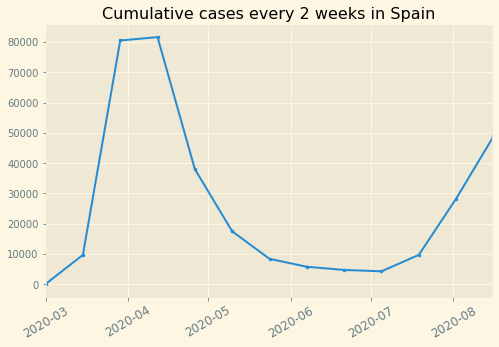

In [37]:
plt.rcParams["figure.figsize"] = (8,5)
plt.plot_date(df_spain_2W["date"], df_spain_2W["new_cases"], markersize=2.5, linewidth=2, linestyle='-')
plt.title("Cumulative cases every 2 weeks in Spain", fontsize=16)
tstart = datetime(2020,3,1)
tend = datetime.now()
plt.xlim([tstart, tend])
plt.xticks(rotation="30", fontsize=12)
plt.show()

Let's now graph the pandemic curve for each country to see how they are responding to the pandemia

In [55]:
df_min1case = df.loc[df["total_cases"]>0]

In [63]:
df_min1case = df_min1case.reset_index().drop("index", axis=1)

In [90]:
countries_plot_list = df_min1case.loc[df_min1case["total_cases"] > (df_min1case["total_cases"].mean()/2)]["location"].unique()

In [100]:
cases_weekly = []
for j in countries_plot_list:
    for i in range(len(df)):
        if df.loc[i,"location"]==j:
            weekly_cases = df.loc[(((df["date"] >= 
            (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=1)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==j))]["new_cases"].sum()

            date = df.loc[i,"date"]

            cases_weekly.append((j, date, weekly_cases))

In [101]:
df_cases_weekly = pd.DataFrame(cases_weekly, columns=["country", "date", "cases_weekly"])

In [102]:
df_cases_weekly

,country,date,cases_weekly
0,Afghanistan,2019-12-31,0.0
1,Afghanistan,2020-01-01,0.0
2,Afghanistan,2020-01-02,0.0
3,Afghanistan,2020-01-03,0.0
4,Afghanistan,2020-01-04,0.0
...,...,...,...
11897,World,2020-08-10,1783160.0
11898,World,2020-08-11,1789515.0
11899,World,2020-08-12,1804937.0
11900,World,2020-08-13,1810676.0


In [97]:
df_cases_weekly.dtypes

country                 object
date            datetime64[ns]
cases_weekly           float64
dtype: object

In [133]:
# generating a range of colors and using them for the line plots

from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

viridis = cm.get_cmap('viridis', 200)
plasma = cm.get_cmap('plasma', 200)
magma = cm.get_cmap('magma', 200)
top = cm.get_cmap('Oranges_r', 128)
bottom = cm.get_cmap('Blues', 128)
newcolors = np.vstack((top(np.linspace(0, 1, 128)),
                       bottom(np.linspace(0, 1, 128))))
newcmp = ListedColormap(newcolors, name='OrangeBlue')

More about colors [here](https://matplotlib.org/3.1.0/tutorials/colors/colormaps.html)

In [124]:
print(viridis)

In [113]:
country_l = df_cases_weekly["country"].unique()

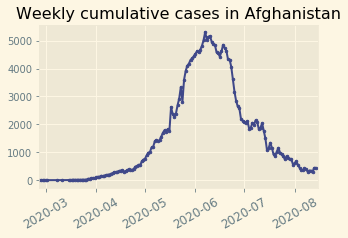

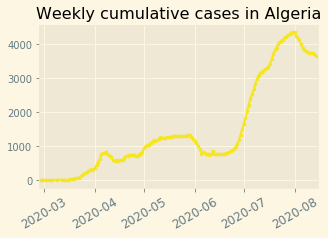

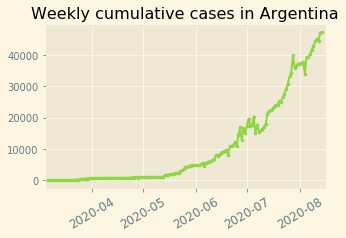

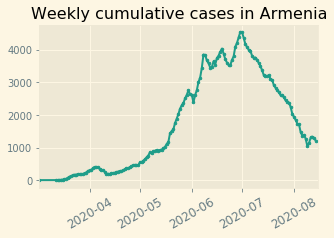

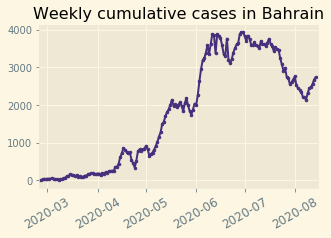

...

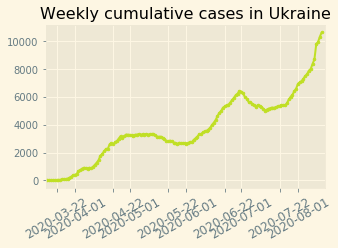

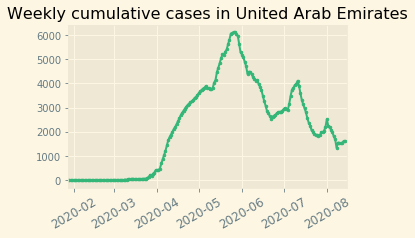

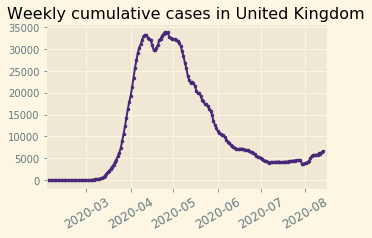

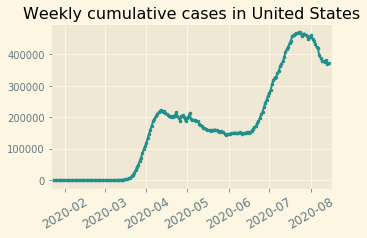

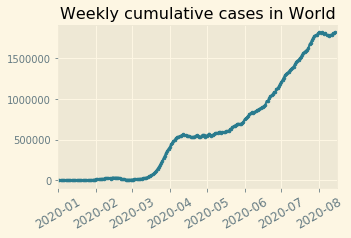

In [125]:
plt.rcParams["figure.figsize"] = (5,3)
for i in country_l:
    plt.plot_date(df_cases_weekly[df_cases_weekly["country"]==i]["date"], 
                  df_cases_weekly[df_cases_weekly["country"]==i]["cases_weekly"], 
                  markersize=2.5, linewidth=2, linestyle='-', color=viridis(random.uniform(0, 1)))
    plt.title("Weekly cumulative cases in {}".format(i), fontsize=16)
                  
    tstart = df_cases_weekly[(df_cases_weekly["country"]==i)
    & (df_cases_weekly["cases_weekly"] >0)]["date"].min().date()
    tend = datetime.now()
    plt.xlim([tstart, tend])
    plt.xticks(rotation="30", fontsize=12)
    plt.show()

In [107]:
deaths_weekly = []
for j in countries_plot_list:
    for i in range(len(df)):
        if df.loc[i,"location"]==j:
            weekly_deaths = df.loc[(((df["date"] >= 
            (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=1)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==j))]["new_deaths"].sum()

            date = df.loc[i,"date"]

            deaths_weekly.append((j, date, weekly_deaths))

In [109]:
df_deaths_weekly = pd.DataFrame(deaths_weekly, columns=["country", "date", "deaths_weekly"])

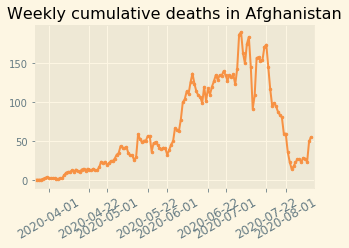

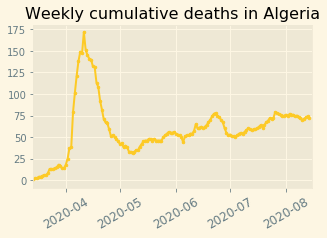

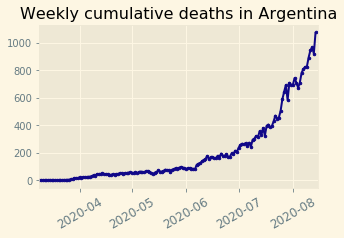

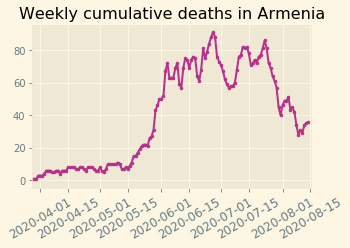

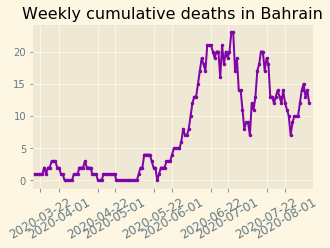

...

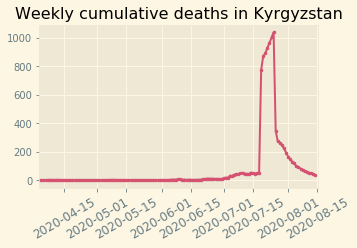

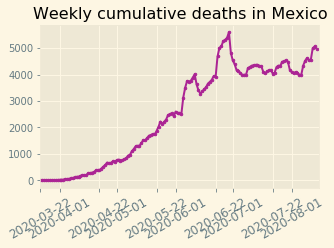

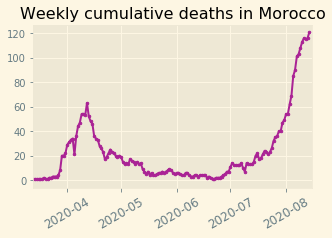

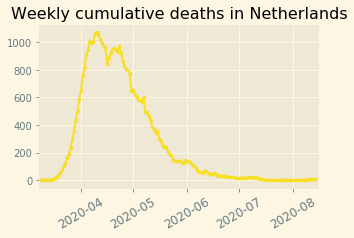

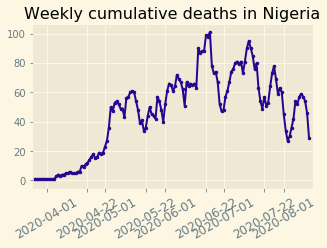

In [ ]:
plt.rcParams["figure.figsize"] = (5,3)
for i in (df_deaths_weekly["country"].unique()):
    plt.plot_date(df_deaths_weekly[df_deaths_weekly["country"]==i]["date"], 
                  df_deaths_weekly[df_deaths_weekly["country"]==i]["deaths_weekly"], 
                  markersize=2.5, linewidth=2, linestyle='-', color=plasma(random.uniform(0,1)))
    plt.title("Weekly cumulative deaths in {}".format(i), fontsize=16)
    tstart = df_deaths_weekly[(df_cases_weekly["country"]==i)
    & (df_deaths_weekly["deaths_weekly"] >0)]["date"].min().date()
    tend = datetime.now()
    plt.xlim([tstart, tend])
    plt.xticks(rotation="30", fontsize=12)
    plt.show()

In [42]:
list_top_five_cases

array(['United States', 'Brazil', 'India', 'Russia', 'South Africa'],
      dtype=object)

In [43]:
list_top_five_deaths

array(['United States', 'Brazil', 'Mexico', 'India', 'United Kingdom'],
      dtype=object)

In [44]:
cases_weekly_top1 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_top_five_cases[0]:
        two_weeks_cases = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=2)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_top_five_cases[0]))]["new_cases"].sum()
        
        date = df.loc[i,"date"]
    
        cases_weekly_top1.append((date, two_weeks_cases))

cases_weekly_top2 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_top_five_cases[1]:
        two_weeks_cases = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=2)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_top_five_cases[1]))]["new_cases"].sum()
        
        date = df.loc[i,"date"]
    
        cases_weekly_top2.append((date, two_weeks_cases))
        
cases_weekly_top3 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_top_five_cases[2]:
        two_weeks_cases = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=2)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_top_five_cases[2]))]["new_cases"].sum()
        
        date = df.loc[i,"date"]
    
        cases_weekly_top3.append((date, two_weeks_cases))

cases_weekly_top4 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_top_five_cases[3]:
        two_weeks_cases = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=2)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_top_five_cases[3]))]["new_cases"].sum()
        
        date = df.loc[i,"date"]
    
        cases_weekly_top4.append((date, two_weeks_cases))

cases_weekly_top5 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_top_five_cases[4]:
        two_weeks_cases = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=2)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_top_five_cases[4]))]["new_cases"].sum()
        
        date = df.loc[i,"date"]
    
        cases_weekly_top5.append((date, two_weeks_cases))

df_cases_weekly_top1 = pd.DataFrame(cases_weekly_top1, columns=["date", "cases_weekly"])
df_cases_weekly_top2 = pd.DataFrame(cases_weekly_top2, columns=["date", "cases_weekly"])
df_cases_weekly_top3 = pd.DataFrame(cases_weekly_top3, columns=["date", "cases_weekly"])
df_cases_weekly_top4 = pd.DataFrame(cases_weekly_top4, columns=["date", "cases_weekly"])
df_cases_weekly_top5 = pd.DataFrame(cases_weekly_top5, columns=["date", "cases_weekly"])

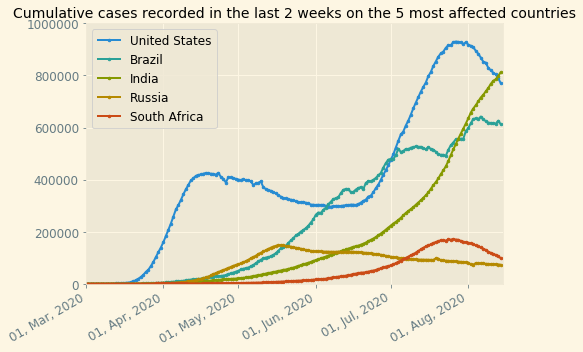

In [45]:
plt.rcParams["figure.figsize"] = (8,5)
plt.plot_date(df_cases_weekly_top1["date"], df_cases_weekly_top1["cases_weekly"], markersize=2.5, linewidth=2, linestyle='-')
plt.plot_date(df_cases_weekly_top2["date"], df_cases_weekly_top2["cases_weekly"], markersize=2.5, linewidth=2, linestyle='-')
plt.plot_date(df_cases_weekly_top3["date"], df_cases_weekly_top3["cases_weekly"], markersize=2.5, linewidth=2, linestyle='-')
plt.plot_date(df_cases_weekly_top4["date"], df_cases_weekly_top4["cases_weekly"], markersize=2.5, linewidth=2, linestyle='-')
plt.plot_date(df_cases_weekly_top5["date"], df_cases_weekly_top5["cases_weekly"], markersize=2.5, linewidth=2, linestyle='-')
plt.legend(list_top_five_cases, scatterpoints=1, loc= "upper left", fontsize=12,  ncol=1)
plt.gcf().autofmt_xdate() # gcf (get current figure)
date_format = mpl_dates.DateFormatter("%d, %b, %Y")
plt.gca().xaxis.set_major_formatter(date_format)
plt.title("Cumulative cases recorded in the last 2 weeks on the 5 most affected countries", fontsize=14)
plt.xticks(rotation="30", fontsize=12)
plt.yticks(rotation="horizontal", fontsize=12)
tstart = datetime(2020,3,1)
tend = datetime.now()
plt.xlim([tstart, tend])
plt.ylim(0, 1000000)
plt.tight_layout()
# plt.savefig("cumulative_cases_2W_top5.png")
plt.show()

We can clearly see that in the United States the tendency in the reduction of cases has abrouptely been inverted, and its currently incresing quickly. It seems that this may be due to the spread of the virus accross states in America where mask policies and other restrictions have been more relaxed. Similar applies to Brazil, although the spread seems to be stabilizing. Finally, looking at the graph is appear like the spread is accelerating also in India, where due to its high population it may become the next epicenter of this pandemia.

Lets make some feature engineering to estimate an estimated amount of cases in the most affected countries based on the amount of tests performed

In [46]:
deaths_weekly_top1 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_top_five_deaths[0]:
        two_weeks_deaths = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=2)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_top_five_deaths[0]))]["new_deaths"].sum()
        
        date = df.loc[i,"date"]
    
        deaths_weekly_top1.append((date, two_weeks_deaths))

deaths_weekly_top2 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_top_five_deaths[1]:
        two_weeks_deaths = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=2)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_top_five_deaths[1]))]["new_deaths"].sum()
        
        date = df.loc[i,"date"]
    
        deaths_weekly_top2.append((date, two_weeks_deaths))
        
deaths_weekly_top3 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_top_five_deaths[2]:
        two_weeks_deaths = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=2)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_top_five_deaths[2]))]["new_deaths"].sum()
        
        date = df.loc[i,"date"]
    
        deaths_weekly_top3.append((date, two_weeks_deaths))

deaths_weekly_top4 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_top_five_deaths[3]:
        two_weeks_deaths = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=2)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_top_five_deaths[3]))]["new_deaths"].sum()
        
        date = df.loc[i,"date"]
    
        deaths_weekly_top4.append((date, two_weeks_deaths))

deaths_weekly_top5 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_top_five_deaths[4]:
        two_weeks_deaths = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=2)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_top_five_deaths[4]))]["new_deaths"].sum()
        
        date = df.loc[i,"date"]
    
        deaths_weekly_top5.append((date, two_weeks_deaths))

df_deaths_weekly_top1 = pd.DataFrame(deaths_weekly_top1, columns=["date", "cases_weekly"])
df_deaths_weekly_top2 = pd.DataFrame(deaths_weekly_top2, columns=["date", "cases_weekly"])
df_deaths_weekly_top3 = pd.DataFrame(deaths_weekly_top3, columns=["date", "cases_weekly"])
df_deaths_weekly_top4 = pd.DataFrame(deaths_weekly_top4, columns=["date", "cases_weekly"])
df_deaths_weekly_top5 = pd.DataFrame(deaths_weekly_top5, columns=["date", "cases_weekly"])

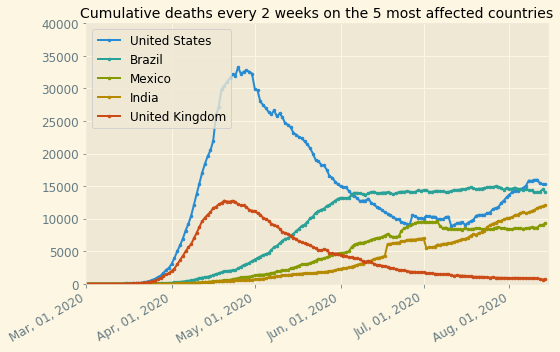

In [47]:
plt.plot_date(df_deaths_weekly_top1["date"], df_deaths_weekly_top1["cases_weekly"], markersize=2.5, linewidth=2, linestyle='-')
plt.plot_date(df_deaths_weekly_top2["date"], df_deaths_weekly_top2["cases_weekly"], markersize=2.5, linewidth=2, linestyle='-')
plt.plot_date(df_deaths_weekly_top3["date"], df_deaths_weekly_top3["cases_weekly"], markersize=2.5, linewidth=2, linestyle='-')
plt.plot_date(df_deaths_weekly_top4["date"], df_deaths_weekly_top4["cases_weekly"], markersize=2.5, linewidth=2, linestyle='-')
plt.plot_date(df_deaths_weekly_top5["date"], df_deaths_weekly_top5["cases_weekly"], markersize=2.5, linewidth=2, linestyle='-')
plt.legend(list_top_five_deaths, scatterpoints=1, loc= "upper left", fontsize=12,  ncol=1)
plt.gcf().autofmt_xdate() # gcf (get current figure)
date_format = mpl_dates.DateFormatter("%b, %d, %Y")
plt.gca().xaxis.set_major_formatter(date_format)
plt.title("Cumulative deaths every 2 weeks on the 5 most affected countries", fontsize=14)
plt.xticks(rotation="30", fontsize=12)
plt.yticks(rotation="horizontal", fontsize=12)
tstart = datetime(2020,3,1)
tend = datetime.now()
plt.xlim([tstart, tend])
plt.ylim(0, 40000)
plt.tight_layout()
# plt.savefig("cumulative_deaths_2W_top5.png")
plt.show()

Lets now take a look to the death rates among the countries. I will select a df containing  countries where the total amount of cases reported are above the mean (Most affected countries). I will also select those rows from the df that contain information about the test performed by 1000 since this is an important factor to consider.

In [48]:
df_droped_na = df.dropna(how="any", subset=["total_tests_per_thousand"])

In [49]:
df_droped_na = df_droped_na.loc[(df_droped_na["total_cases"]>df_droped_na["total_cases"].mean())].sort_values(by="perc_death/cases", ascending=False)

In [50]:
df_droped_na.columns

Index(['iso_code', 'continent', 'location', 'date', 'total_cases', 'new_cases',
       'total_deaths', 'new_deaths', 'total_cases_per_million',
       'new_cases_per_million', 'total_deaths_per_million',
       'new_deaths_per_million', 'new_tests', 'total_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'tests_per_case', 'positive_rate', 'tests_units', 'stringency_index',
       'population', 'population_density', 'median_age', 'aged_65_older',
       'aged_70_older', 'gdp_per_capita', 'extreme_poverty',
       'cardiovasc_death_rate', 'diabetes_prevalence', 'female_smokers',
       'male_smokers', 'handwashing_facilities', 'hospital_beds_per_thousand',
       'life_expectancy', 'perc_death/cases'],
      dtype='object')

In [51]:
list_countries = df_droped_na["location"].unique()

In [52]:
# lets create a df with the information most recent available for each country
df_recent= pd.DataFrame()
for i in list_countries:
    row = pd.DataFrame(df_droped_na.loc[(df_droped_na["location"]==i)].sort_values(by="date", ascending=False).iloc[0,:]).transpose()
    df_recent = df_recent.append(row,ignore_index=True) # apending each row (recent info for each country) to the new df

In [53]:
df_recent.sort_values(by="perc_death/cases", ascending=False, inplace=True)

In [54]:
df_recent.reset_index(inplace=True)

In [55]:
df_recent.columns

Index(['index', 'iso_code', 'continent', 'location', 'date', 'total_cases',
       'new_cases', 'total_deaths', 'new_deaths', 'total_cases_per_million',
       'new_cases_per_million', 'total_deaths_per_million',
       'new_deaths_per_million', 'new_tests', 'total_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'tests_per_case', 'positive_rate', 'tests_units', 'stringency_index',
       'population', 'population_density', 'median_age', 'aged_65_older',
       'aged_70_older', 'gdp_per_capita', 'extreme_poverty',
       'cardiovasc_death_rate', 'diabetes_prevalence', 'female_smokers',
       'male_smokers', 'handwashing_facilities', 'hospital_beds_per_thousand',
       'life_expectancy', 'perc_death/cases'],
      dtype='object')

In [56]:
for i in ['total_cases',
       'new_cases', 'total_deaths', 'new_deaths', 'total_cases_per_million',
       'new_cases_per_million', 'total_deaths_per_million',
       'new_deaths_per_million', 'total_tests', 'new_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'stringency_index', 'population', 'population_density', 'median_age',
       'aged_65_older', 'aged_70_older', 'gdp_per_capita', 'extreme_poverty',
       'cardiovasc_death_rate', 'diabetes_prevalence', 'female_smokers',
       'male_smokers', 'handwashing_facilities', 'hospital_beds_per_thousand',
       'life_expectancy', 'perc_death/cases']:
    df_recent[i] = df_recent[i].astype("float")

In [57]:
df_recent.dtypes

index                                       int64
iso_code                                   object
continent                                  object
location                                   object
date                               datetime64[ns]
total_cases                               float64
new_cases                                 float64
total_deaths                              float64
new_deaths                                float64
total_cases_per_million                   float64
new_cases_per_million                     float64
total_deaths_per_million                  float64
new_deaths_per_million                    float64
new_tests                                 float64
total_tests                               float64
total_tests_per_thousand                  float64
new_tests_per_thousand                    float64
new_tests_smoothed                        float64
new_tests_smoothed_per_thousand           float64
tests_per_case                             object


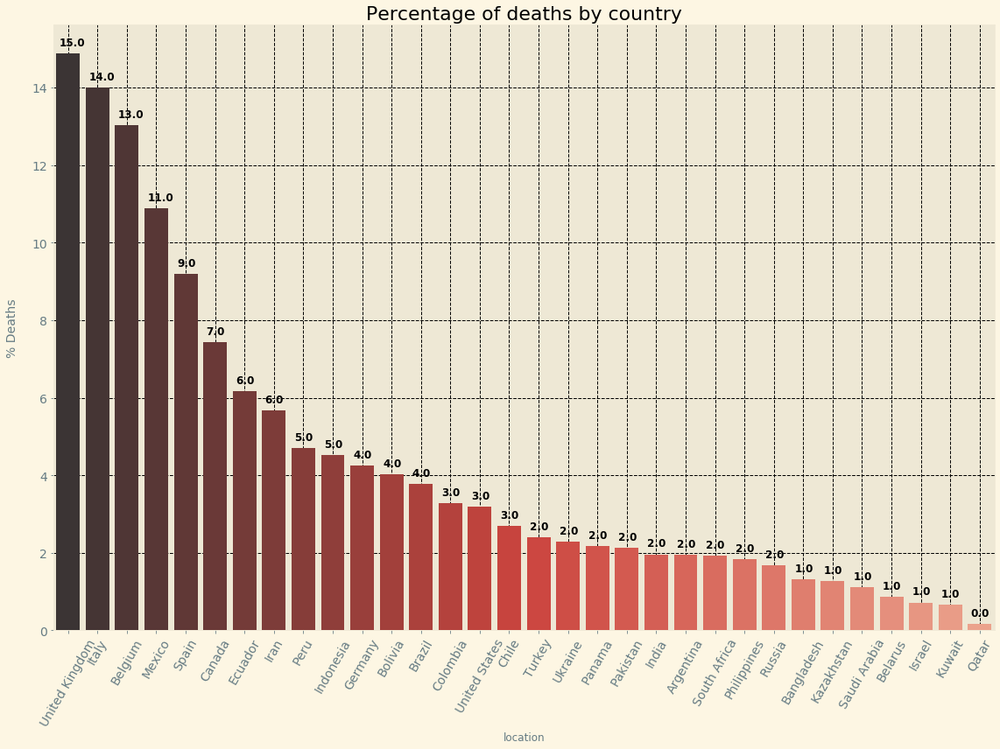

In [58]:
plt.rcParams["figure.figsize"] = (16,12)
x = [-0.1, 0.9, 1.9, 2.9, 3.9, 4.9, 5.9, 6.9, 7.9, 8.9, 9.9, 10.9, 11.9,12.9, 13.9, 14.9, 15.9, 16.9, 17.9, 18.9, 19.9, 20.9, 21.9, 22.9, 23.9,24.9, 25.9, 26.9, 27.9, 28.9, 29.9, 30.9]
y = list(df_recent["perc_death/cases"])
countries = df_recent["location"]
sns.barplot(x=df_recent["location"],y=df_recent["perc_death/cases"], data=df_recent, palette="Reds_d")

plt.title("Percentage of deaths by country", fontsize=22)
plt.ylabel("% Deaths",  labelpad=15, fontsize=14)
plt.xticks(rotation="60", fontsize=14)
plt.yticks(rotation="horizontal", fontsize=14)
#plt.legend(df7["location"], loc="upper right")
plt.grid(color="k", linestyle="--")

for i, label in enumerate((df_recent["perc_death/cases"]).round()):
    plt.text(x[i]-0.2, y[i]+0.2, label, fontsize=12, fontweight='bold')
plt.tight_layout()
# plt.savefig("perc_deaths_country.png")

Looking at these data of deaths and testing we observe some important differences among countries regarding death rates. Lets take a look to the corr among variables to see what may be driving the differences in death rates

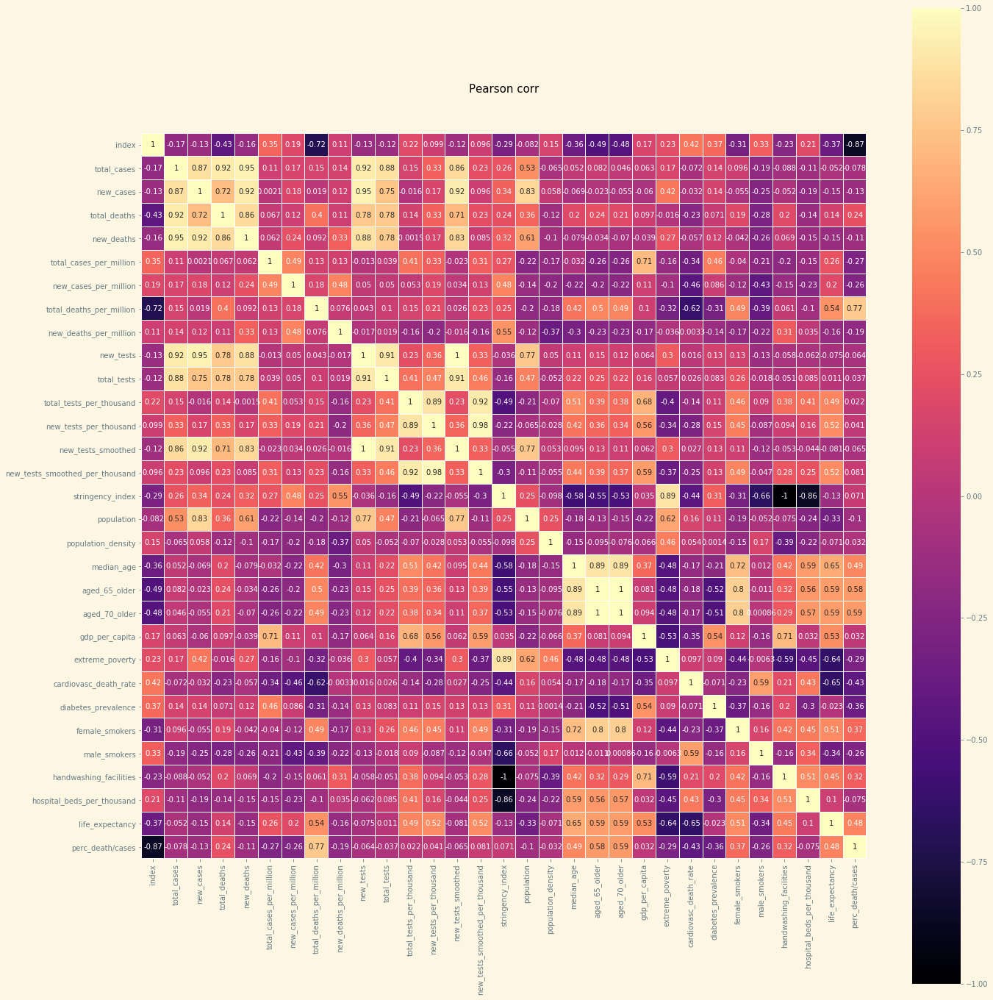

In [59]:
colormap=plt.cm.magma
f, ax = plt.subplots(figsize=(20,20))
plt.title("Pearson corr", y=1.05, size=15)
ax = sns.heatmap(df_recent.corr(), linewidths=0.1, vmax=1.0, square=True, cmap=colormap, linecolor="white", annot=True)
plt.tight_layout()
plt.show()

A main factor that seems to be driving the higher death/cases ratio is the higher amount of older people (corr = 0.62) followed by life expectancy (0.53) and median age (0.49)

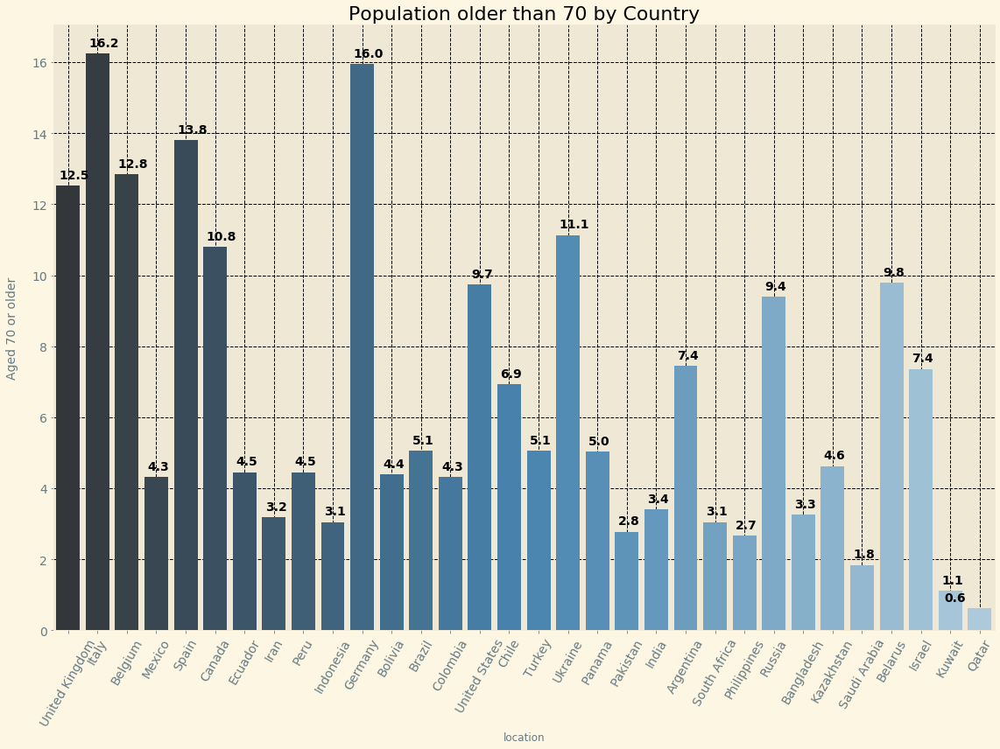

In [60]:
plt.rcParams["figure.figsize"] = (16,12)
x = [-0.1, 0.9, 1.9, 2.9, 3.9, 4.9, 5.9, 6.9, 7.9, 8.9, 9.9, 10.9, 11.9,12.9, 13.9, 14.9, 15.9, 16.9, 17.9, 18.9, 19.9, 20.9, 21.9, 22.9, 23.9,24.9, 25.9, 26.9, 27.9, 28.9,29.9,30,9]
y = list(df_recent["aged_70_older"])
countries = df_recent["location"]
sns.barplot(x=df_recent["location"],y=df_recent["aged_70_older"], data=df_recent, palette="Blues_d")

plt.title("Population older than 70 by Country", fontsize=22)
plt.ylabel("Aged 70 or older",  labelpad=15, fontsize=14)
plt.xticks(rotation="60", fontsize=14)
plt.yticks(rotation="horizontal", fontsize=14)
#plt.legend(df7["location"], loc="upper right")
plt.grid(color="k", linestyle="--")

for i, label in enumerate(df_recent["aged_70_older"].round(1)):
    plt.text(x[i]-0.2, y[i]+0.2, label, fontsize=14, fontweight='bold')
plt.tight_layout()
# plt.savefig("population_aged70_country.png")

Germany stands out as a country with a high percentage of older populacion and yet a low death rate. Lets compare the data from Germany with the means of the data set to deduce posible factors driving this observation.

In [61]:
df_recent.describe()

,index,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,total_deaths_per_million,new_deaths_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,perc_death/cases
count,32.000000,3.200000e+01,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,29.000000,3.200000e+01,32.000000,29.000000,32.000000,32.000000,13.000000,3.200000e+01,32.000000,32.000000,32.000000,32.000000,32.000000,26.000000,32.000000,32.000000,31.000000,30.000000,11.000000,32.000000,32.000000,32.000000
mean,15.500000,5.265442e+05,6652.531250,19365.843750,167.125000,7849.248875,76.297031,253.261156,2.062437,94041.034483,6.241486e+06,80.954656,0.907034,78797.156250,0.819906,65.847692,1.189799e+08,163.903469,33.809375,10.105094,6.582781,26954.742906,3.830769,221.772219,8.325938,11.203226,32.256667,63.534091,3.141875,76.228125,4.257047
std,9.380832,1.001771e+06,15003.222529,32616.219519,316.813953,7656.859512,73.798553,232.931938,2.646457,222050.343990,1.282734e+07,69.661933,0.891414,172255.968638,0.699132,20.423129,2.445371e+08,240.020453,6.582791,5.967567,4.348362,22912.949457,5.728300,127.657289,3.435333,9.497631,14.260040,22.498694,2.654014,4.797881,4.013572
min,0.000000,6.900500e+04,58.000000,190.000000,0.000000,477.904000,2.834000,19.374000,0.000000,2861.000000,1.869640e+05,3.755000,0.054000,2875.000000,0.047000,11.110000,2.881060e+06,4.037000,23.500000,1.307000,0.617000,3523.984000,0.100000,85.755000,4.280000,0.800000,9.900000,25.383000,0.530000,64.130000,0.166757
25%,7.750000,9.940050e+04,720.750000,2982.500000,8.750000,3133.556000,16.458500,65.780000,0.231750,6486.000000,1.047695e+06,15.642500,0.253000,10877.000000,0.250500,56.940000,1.849330e+07,25.106750,29.250000,5.416000,3.242000,11974.715500,0.275000,127.054750,6.122500,2.750000,22.200000,51.771500,1.470000,72.587500,1.795487
50%,15.500000,2.546565e+05,1687.500000,7584.000000,30.000000,5979.139500,44.924500,150.072000,0.793000,20063.000000,1.977924e+06,61.485000,0.615000,22554.500000,0.711000,65.280000,4.881883e+07,66.691500,31.900000,7.782000,4.827500,20674.828500,1.650000,173.987500,7.270000,8.100000,31.400000,64.204000,2.310000,76.675000,2.554504
75%,23.250000,3.837968e+05,4160.000000,18804.000000,205.750000,9184.877500,112.272750,384.103000,3.272750,40425.000000,4.445768e+06,124.187750,1.431000,48105.500000,1.218250,80.560000,1.144190e+08,233.350000,39.775000,14.952500,9.746000,36353.374000,3.900000,286.210750,8.742500,17.650000,41.025000,79.549000,3.037500,80.192500,4.941115
max,31.000000,5.197148e+06,66999.000000,166027.000000,1490.000000,39547.250000,252.853000,854.644000,11.237000,880729.000000,6.461203e+07,219.111000,3.327000,708480.000000,2.392000,89.810000,1.380004e+09,1265.036000,47.900000,23.021000,16.240000,116935.600000,21.200000,539.849000,17.720000,34.200000,76.100000,98.999000,11.000000,83.560000,14.874564


In [62]:
df_germany = df_recent.loc[df_recent["location"]=="Germany"]

In [63]:
df_germany.describe()

,index,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,total_deaths_per_million,new_deaths_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,perc_death/cases
count,1.0,1.0,1.0,1.0,1.0,1.000,1.000,1.000,1.000,0.0,1.0,1.000,0.0,1.0,1.000,1.00,1.0,1.000,1.0,1.000,1.000,1.000,0.0,1.000,1.00,1.0,1.0,0.0,1.0,1.00,1.000000
mean,12.0,215891.0,555.0,9196.0,1.0,2576.759,6.624,109.758,0.012,NaN,9265361.0,110.586,NaN,96024.0,1.146,56.94,83783945.0,237.016,46.6,21.453,15.957,45229.245,NaN,156.139,8.31,28.2,33.1,NaN,8.0,81.33,4.259557
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,12.0,215891.0,555.0,9196.0,1.0,2576.759,6.624,109.758,0.012,NaN,9265361.0,110.586,NaN,96024.0,1.146,56.94,83783945.0,237.016,46.6,21.453,15.957,45229.245,NaN,156.139,8.31,28.2,33.1,NaN,8.0,81.33,4.259557
25%,12.0,215891.0,555.0,9196.0,1.0,2576.759,6.624,109.758,0.012,NaN,9265361.0,110.586,NaN,96024.0,1.146,56.94,83783945.0,237.016,46.6,21.453,15.957,45229.245,NaN,156.139,8.31,28.2,33.1,NaN,8.0,81.33,4.259557
50%,12.0,215891.0,555.0,9196.0,1.0,2576.759,6.624,109.758,0.012,NaN,9265361.0,110.586,NaN,96024.0,1.146,56.94,83783945.0,237.016,46.6,21.453,15.957,45229.245,NaN,156.139,8.31,28.2,33.1,NaN,8.0,81.33,4.259557
75%,12.0,215891.0,555.0,9196.0,1.0,2576.759,6.624,109.758,0.012,NaN,9265361.0,110.586,NaN,96024.0,1.146,56.94,83783945.0,237.016,46.6,21.453,15.957,45229.245,NaN,156.139,8.31,28.2,33.1,NaN,8.0,81.33,4.259557
max,12.0,215891.0,555.0,9196.0,1.0,2576.759,6.624,109.758,0.012,NaN,9265361.0,110.586,NaN,96024.0,1.146,56.94,83783945.0,237.016,46.6,21.453,15.957,45229.245,NaN,156.139,8.31,28.2,33.1,NaN,8.0,81.33,4.259557


In [64]:
df_germany 

,index,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,total_deaths_per_million,new_deaths_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,tests_per_case,positive_rate,tests_units,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,perc_death/cases
10,12,DEU,Europe,Germany,2020-08-09,215891.0,555.0,9196.0,1.0,2576.759,6.624,109.758,0.012,NaN,9265361.0,110.586,NaN,96024.0,1.146,112.065,0.009,tests performed,56.94,83783945.0,237.016,46.6,21.453,15.957,45229.245,NaN,156.139,8.31,28.2,33.1,NaN,8.0,81.33,4.259557


The high life expectancy and high number of beds per 1000 in Germany points out to these factors as posible contributors to this observation. Otherwise this remains a mistery, since the cardiovascular death rate, diabetes incidence or males smokers are not particularly low in Germany compared to other countries.

On the other exteme is Mexico, which despite having a young population, it displayes one of the highest death/cases ratio. This could be due to the low testing rate in this country. Lets check this

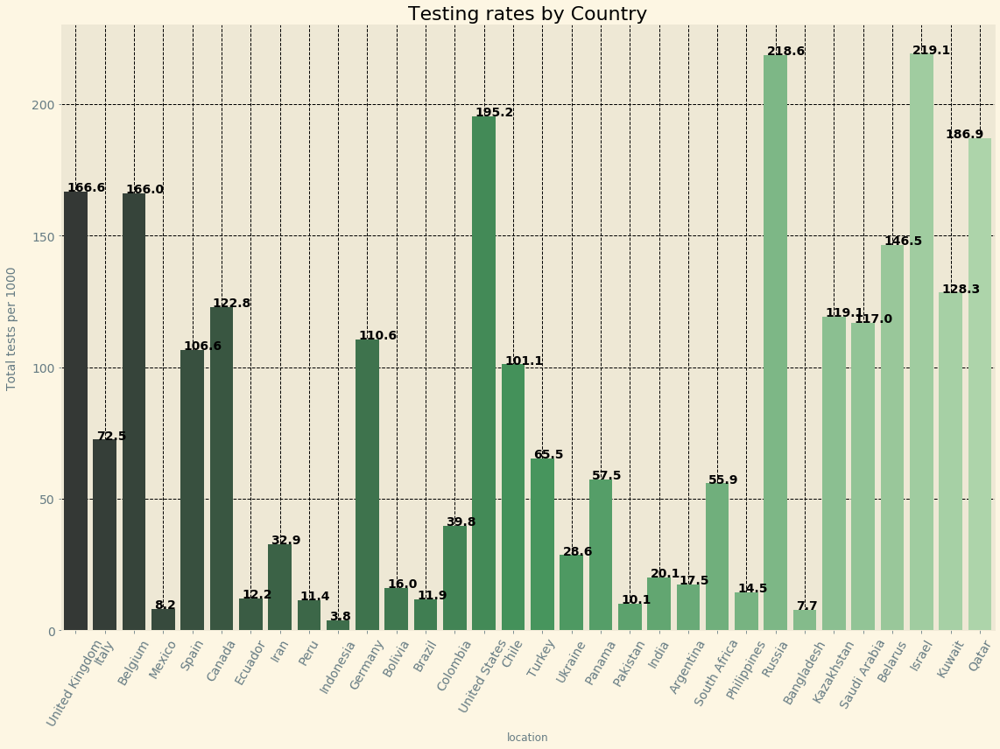

In [65]:
plt.rcParams["figure.figsize"] = (16,12)
x = [-0.1, 0.9, 1.9, 2.9, 3.9, 4.9, 5.9, 6.9, 7.9, 8.9, 9.9, 10.9, 11.9,12.9, 13.9, 14.9, 15.9, 16.9, 17.9, 18.9, 19.9, 20.9, 21.9, 22.9, 23.9,24.9, 25.9, 26.9, 27.9, 28.9,29.9,30,9]
y = list(df_recent["total_tests_per_thousand"])
countries = df_recent["location"]
sns.barplot(x=df_recent["location"],y=df_recent["total_tests_per_thousand"], data=df_recent, palette="Greens_d")

plt.title("Testing rates by Country", fontsize=22)
plt.ylabel("Total tests per 1000",  labelpad=15, fontsize=14)
plt.xticks(rotation="60", fontsize=14)
plt.yticks(rotation="horizontal", fontsize=14)
#plt.legend(df7["location"], loc="upper right")
plt.grid(color="k", linestyle="--")

for i, label in enumerate(df_recent["total_tests_per_thousand"].round(1)):
    plt.text(x[i]-0.2, y[i]+0.2, label, fontsize=14, fontweight='bold')
plt.tight_layout()
# plt.savefig("test_rates_country.png")

Indeed, mexico appears to be one of the countries with the lowest testing rates

Another aspect that may be important in the control of the pandemia is the speed at which testing is done at the beginning, since a quick detection of the virus is critical for the control. Lets plot the cumulative number of tests weekly to compare the response of the different countries in different countries and to see whether if those with high testing rates at the beginning responded better by observing also at the cumulative cases.

In [66]:
df

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,total_deaths_per_million,new_deaths_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,tests_per_case,positive_rate,tests_units,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,perc_death/cases
0,AFG,Asia,Afghanistan,2019-12-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.000000
1,AFG,Asia,Afghanistan,2020-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.000000
2,AFG,Asia,Afghanistan,2020-01-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.000000
3,AFG,Asia,Afghanistan,2020-01-03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.000000
4,AFG,Asia,Afghanistan,2020-01-04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36769,NaN,NaN,International,2020-02-28,705.0,0.0,4.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.567376
36770,NaN,NaN,International,2020-02-29,705.0,0.0,6.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.851064
36771,NaN,NaN,International,2020-03-01,705.0,0.0,6.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.851064
36772,NaN,NaN,International,2020-03-02,705.0,0.0,6.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.851064


In [67]:
df.loc[~(df["new_tests_per_thousand"].isnull())]["location"].unique()

array(['Argentina', 'Australia', 'Austria', 'Bahrain', 'Bangladesh',
       'Belarus', 'Belgium', 'Bolivia', 'Bulgaria', 'Canada', 'Chile',
       'Colombia', 'Costa Rica', "Cote d'Ivoire", 'Croatia', 'Cuba',
       'Czech Republic', 'Democratic Republic of Congo', 'Denmark',
       'Ecuador', 'El Salvador', 'Estonia', 'Ethiopia', 'Fiji', 'Finland',
       'France', 'Ghana', 'Greece', 'Hungary', 'Iceland', 'India',
       'Indonesia', 'Iran', 'Ireland', 'Israel', 'Italy', 'Japan',
       'Kazakhstan', 'Kenya', 'Kuwait', 'Latvia', 'Lithuania',
       'Luxembourg', 'Malaysia', 'Maldives', 'Malta', 'Mexico', 'Morocco',
       'Myanmar', 'Nepal', 'New Zealand', 'Nigeria', 'Norway', 'Oman',
       'Pakistan', 'Panama', 'Paraguay', 'Peru', 'Philippines', 'Poland',
       'Portugal', 'Qatar', 'Romania', 'Russia', 'Rwanda', 'Saudi Arabia',
       'Senegal', 'Serbia', 'Slovakia', 'Slovenia', 'South Africa',
       'South Korea', 'Sweden', 'Switzerland', 'Taiwan', 'Thailand',
       'Togo', 'Tun

In [68]:
list_countries= ["Belgium", "Italy", "United States", "Denmark", "South Korea", "Switzerland","Austria"]

In [69]:
# First, lets look at the testing

cases_weekly_top1 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_countries[0]:
        two_weeks_cases = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=1)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_countries[0]))]["new_tests_per_thousand"].mean()
        
        date = df.loc[i,"date"]
    
        cases_weekly_top1.append((date, two_weeks_cases))

cases_weekly_top2 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_countries[1]:
        two_weeks_cases = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=1)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_countries[1]))]["new_tests_per_thousand"].mean()
        
        date = df.loc[i,"date"]
    
        cases_weekly_top2.append((date, two_weeks_cases))
        
cases_weekly_top3 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_countries[2]:
        two_weeks_cases = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=1)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_countries[2]))]["new_tests_per_thousand"].mean()
        
        date = df.loc[i,"date"]
    
        cases_weekly_top3.append((date, two_weeks_cases))

cases_weekly_top4 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_countries[3]:
        two_weeks_cases = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=1)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_countries[3]))]["new_tests_per_thousand"].mean()
        
        date = df.loc[i,"date"]
    
        cases_weekly_top4.append((date, two_weeks_cases))

cases_weekly_top5 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_countries[4]:
        two_weeks_cases = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=1)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_countries[4]))]["new_tests_per_thousand"].mean()
        
        date = df.loc[i,"date"]
    
        cases_weekly_top5.append((date, two_weeks_cases))

        
cases_weekly_top6 = []   
for i in range(len(df)):
    if df.loc[i,"location"]==list_countries[5]:
        two_weeks_cases = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=1)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_countries[5]))]["new_tests_per_thousand"].mean()
        
        date = df.loc[i,"date"]
    
        cases_weekly_top6.append((date, two_weeks_cases))
        
cases_weekly_top7 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_countries[4]:
        two_weeks_cases = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=1)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_countries[6]))]["new_tests_per_thousand"].mean()
        
        date = df.loc[i,"date"]
    
        cases_weekly_top7.append((date, two_weeks_cases))

        
        
df_cases_weekly_top1 = pd.DataFrame(cases_weekly_top1, columns=["date", "cases_weekly"])
df_cases_weekly_top2 = pd.DataFrame(cases_weekly_top2, columns=["date", "cases_weekly"])
df_cases_weekly_top3 = pd.DataFrame(cases_weekly_top3, columns=["date", "cases_weekly"])
df_cases_weekly_top4 = pd.DataFrame(cases_weekly_top4, columns=["date", "cases_weekly"])
df_cases_weekly_top5 = pd.DataFrame(cases_weekly_top5, columns=["date", "cases_weekly"])
df_cases_weekly_top6 = pd.DataFrame(cases_weekly_top6, columns=["date", "cases_weekly"])
df_cases_weekly_top7 = pd.DataFrame(cases_weekly_top7, columns=["date", "cases_weekly"])


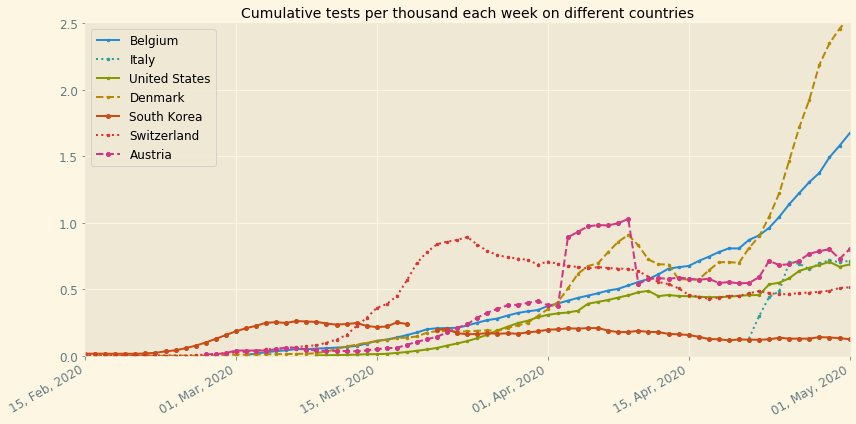

In [70]:
plt.rcParams["figure.figsize"] = (12,6)
plt.plot_date(df_cases_weekly_top1["date"], df_cases_weekly_top1["cases_weekly"], markersize=2.5, linewidth=2, linestyle='-')
plt.plot_date(df_cases_weekly_top2["date"], df_cases_weekly_top2["cases_weekly"], markersize=2.5, linewidth=2, linestyle=':')
plt.plot_date(df_cases_weekly_top3["date"], df_cases_weekly_top3["cases_weekly"], markersize=2.5, linewidth=2, linestyle='-')
plt.plot_date(df_cases_weekly_top4["date"], df_cases_weekly_top4["cases_weekly"], markersize=2.5, linewidth=2, linestyle='--')
plt.plot_date(df_cases_weekly_top5["date"], df_cases_weekly_top5["cases_weekly"], markersize=4, linewidth=2, linestyle='-')
plt.plot_date(df_cases_weekly_top6["date"], df_cases_weekly_top6["cases_weekly"], markersize=2.5, linewidth=2, linestyle=':')
plt.plot_date(df_cases_weekly_top7["date"], df_cases_weekly_top7["cases_weekly"], markersize=4, linewidth=2, linestyle='--')

plt.legend(list_countries, scatterpoints=1, loc= "upper left", fontsize=12,  ncol=1)
plt.gcf().autofmt_xdate() # gcf (get current figure)
date_format = mpl_dates.DateFormatter("%d, %b, %Y")
plt.gca().xaxis.set_major_formatter(date_format)
plt.title("Cumulative tests per thousand each week on different countries", fontsize=14)
plt.xticks(rotation="30", fontsize=12)
plt.yticks(rotation="horizontal", fontsize=12)
tstart = datetime(2020,2,15)
tend = datetime(2020,5,1)
plt.xlim([tstart, tend])
plt.ylim(0, 2.5)
plt.tight_layout()
# plt.savefig("cumulative_tests_W_per_1000.png")
plt.show()

In [71]:
# Second, lets look at the cases

cases_weekly_top1 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_countries[0]:
        two_weeks_cases = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=1)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_countries[0]))]["new_cases_per_million"].mean()
        
        date = df.loc[i,"date"]
    
        cases_weekly_top1.append((date, two_weeks_cases))

cases_weekly_top2 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_countries[1]:
        two_weeks_cases = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=1)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_countries[1]))]["new_cases_per_million"].mean()
        
        date = df.loc[i,"date"]
    
        cases_weekly_top2.append((date, two_weeks_cases))
        
cases_weekly_top3 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_countries[2]:
        two_weeks_cases = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=1)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_countries[2]))]["new_cases_per_million"].mean()
        
        date = df.loc[i,"date"]
    
        cases_weekly_top3.append((date, two_weeks_cases))

cases_weekly_top4 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_countries[3]:
        two_weeks_cases = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=1)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_countries[3]))]["new_cases_per_million"].mean()
        
        date = df.loc[i,"date"]
    
        cases_weekly_top4.append((date, two_weeks_cases))

cases_weekly_top5 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_countries[4]:
        two_weeks_cases = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=1)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_countries[4]))]["new_cases_per_million"].mean()
        
        date = df.loc[i,"date"]
    
        cases_weekly_top5.append((date, two_weeks_cases))

        
cases_weekly_top6 = []   
for i in range(len(df)):
    if df.loc[i,"location"]==list_countries[5]:
        two_weeks_cases = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=1)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_countries[5]))]["new_cases_per_million"].mean()
        
        date = df.loc[i,"date"]
    
        cases_weekly_top6.append((date, two_weeks_cases))
        
cases_weekly_top7 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_countries[4]:
        two_weeks_cases = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=1)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_countries[6]))]["new_cases_per_million"].mean()
        
        date = df.loc[i,"date"]
    
        cases_weekly_top7.append((date, two_weeks_cases))

   
        
df_cases_weekly_top1 = pd.DataFrame(cases_weekly_top1, columns=["date", "cases_weekly"])
df_cases_weekly_top2 = pd.DataFrame(cases_weekly_top2, columns=["date", "cases_weekly"])
df_cases_weekly_top3 = pd.DataFrame(cases_weekly_top3, columns=["date", "cases_weekly"])
df_cases_weekly_top4 = pd.DataFrame(cases_weekly_top4, columns=["date", "cases_weekly"])
df_cases_weekly_top5 = pd.DataFrame(cases_weekly_top5, columns=["date", "cases_weekly"])
df_cases_weekly_top6 = pd.DataFrame(cases_weekly_top6, columns=["date", "cases_weekly"])
df_cases_weekly_top7 = pd.DataFrame(cases_weekly_top7, columns=["date", "cases_weekly"])


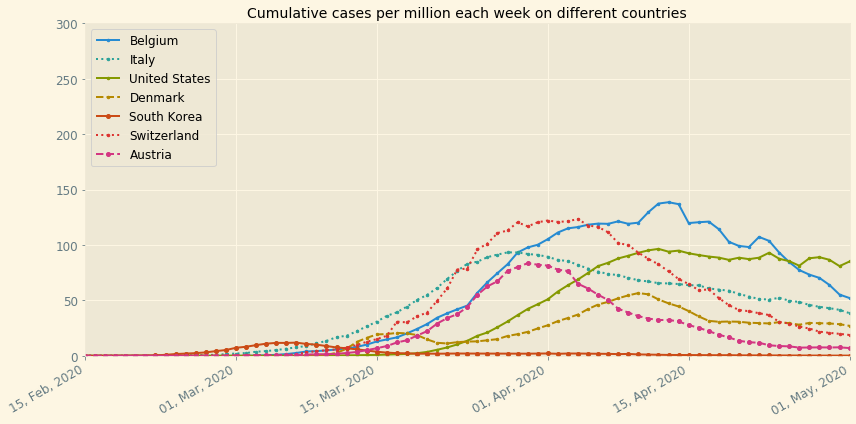

In [72]:
plt.plot_date(df_cases_weekly_top1["date"], df_cases_weekly_top1["cases_weekly"], markersize=2.5, linewidth=2, linestyle='-')
plt.plot_date(df_cases_weekly_top2["date"], df_cases_weekly_top2["cases_weekly"], markersize=2.5, linewidth=2, linestyle=':')
plt.plot_date(df_cases_weekly_top3["date"], df_cases_weekly_top3["cases_weekly"], markersize=2.5, linewidth=2, linestyle='-')
plt.plot_date(df_cases_weekly_top4["date"], df_cases_weekly_top4["cases_weekly"], markersize=2.5, linewidth=2, linestyle='--')
plt.plot_date(df_cases_weekly_top5["date"], df_cases_weekly_top5["cases_weekly"], markersize=4, linewidth=2, linestyle='-')
plt.plot_date(df_cases_weekly_top6["date"], df_cases_weekly_top6["cases_weekly"], markersize=2.5, linewidth=2, linestyle=':')
plt.plot_date(df_cases_weekly_top7["date"], df_cases_weekly_top7["cases_weekly"], markersize=4, linewidth=2, linestyle='--')

plt.legend(list_countries, scatterpoints=1, loc= "upper left", fontsize=12,  ncol=1)
plt.gcf().autofmt_xdate() # gcf (get current figure)
date_format = mpl_dates.DateFormatter("%d, %b, %Y")
plt.gca().xaxis.set_major_formatter(date_format)
plt.title("Cumulative cases per million each week on different countries", fontsize=14)
plt.xticks(rotation="30", fontsize=12)
plt.yticks(rotation="horizontal", fontsize=12)
tstart = datetime(2020,2,15)
tend = datetime(2020,5,1)
plt.xlim([tstart, tend])
plt.ylim(0, 300)
plt.tight_layout()
# plt.savefig("cumulative_cases_W_per_million.png")
plt.show()

If we look at the beginning of the virus spread we observe that countries like south korea, switzerland or denmark, all scaled-up testing  quickly at the beginning, unlike in countries like Italy, Belgium and the United States where the testing was increased steadily but slowly.

Next, lets explore now the evolution of the cases in the currently most affected countries by the number of reported cases


In [73]:
df_top10 = df.loc[df["location"].isin(list_top_ten_cases)]

In [74]:
df_top10.isna().sum()

iso_code                              0
continent                             0
location                              0
date                                  0
total_cases                          48
new_cases                            48
total_deaths                         48
new_deaths                           48
total_cases_per_million              48
new_cases_per_million                48
total_deaths_per_million             48
new_deaths_per_million               48
new_tests                           826
total_tests                         754
total_tests_per_thousand            754
new_tests_per_thousand              826
new_tests_smoothed                  636
new_tests_smoothed_per_thousand     636
tests_per_case                      882
positive_rate                       830
tests_units                         558
stringency_index                     59
population                            0
population_density                    0
median_age                            0


In [75]:
df_top10.dropna(how="any", subset=["total_tests"], inplace=True)

C:\Users\enriq\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


Due to the importance of high testing rates to further dig into the data, lets see whats happening with those countries that are testing the most

In [76]:
list_top_ten_testing_most = df.sort_values("total_tests_per_thousand", ascending=False)["location"].unique()[0:10]

In [77]:
list_top_ten_testing_most 

array(['Luxembourg', 'United Arab Emirates', 'Bahrain', 'Malta',
       'Denmark', 'Iceland', 'Israel', 'Russia', 'Lithuania', 'Australia'],
      dtype=object)

In [78]:
filt_most_test = df["location"].isin(list_top_ten_testing_most )

In [79]:
df_most_test = df.loc[filt_most_test]

In [80]:
df_most_test

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,total_deaths_per_million,new_deaths_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,tests_per_case,positive_rate,tests_units,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,perc_death/cases
1739,AUS,Oceania,Australia,2019-12-31,0.0,0.0,0.0,0.0,0.000,0.000,0.000,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25499881.0,3.202,37.9,15.504,10.129,44648.710,0.5,107.791,5.07,13.0,16.5,NaN,3.84,83.44,0.000000
1740,AUS,Oceania,Australia,2020-01-01,0.0,0.0,0.0,0.0,0.000,0.000,0.000,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,25499881.0,3.202,37.9,15.504,10.129,44648.710,0.5,107.791,5.07,13.0,16.5,NaN,3.84,83.44,0.000000
1741,AUS,Oceania,Australia,2020-01-02,0.0,0.0,0.0,0.0,0.000,0.000,0.000,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,25499881.0,3.202,37.9,15.504,10.129,44648.710,0.5,107.791,5.07,13.0,16.5,NaN,3.84,83.44,0.000000
1742,AUS,Oceania,Australia,2020-01-03,0.0,0.0,0.0,0.0,0.000,0.000,0.000,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,25499881.0,3.202,37.9,15.504,10.129,44648.710,0.5,107.791,5.07,13.0,16.5,NaN,3.84,83.44,0.000000
1743,AUS,Oceania,Australia,2020-01-04,0.0,0.0,0.0,0.0,0.000,0.000,0.000,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,25499881.0,3.202,37.9,15.504,10.129,44648.710,0.5,107.791,5.07,13.0,16.5,NaN,3.84,83.44,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34506,ARE,Asia,United Arab Emirates,2020-08-10,62525.0,225.0,357.0,1.0,6321.787,22.749,36.096,0.101,58953.0,5559654.0,562.126,5.961,52823.0,5.341,242.307,0.004,tests performed,50.0,9890400.0,112.442,34.0,1.144,0.526,67293.483,NaN,317.840,17.26,1.2,37.4,NaN,1.20,77.97,0.570972
34507,ARE,Asia,United Arab Emirates,2020-08-11,62704.0,179.0,357.0,0.0,6339.885,18.098,36.096,0.000,64110.0,5623764.0,568.608,6.482,57782.0,5.842,262.475,0.004,tests performed,50.0,9890400.0,112.442,34.0,1.144,0.526,67293.483,NaN,317.840,17.26,1.2,37.4,NaN,1.20,77.97,0.569342
34508,ARE,Asia,United Arab Emirates,2020-08-12,62966.0,262.0,357.0,0.0,6366.375,26.490,36.096,0.000,72630.0,5696394.0,575.952,7.343,61962.0,6.265,268.732,0.004,tests performed,50.0,9890400.0,112.442,34.0,1.144,0.526,67293.483,NaN,317.840,17.26,1.2,37.4,NaN,1.20,77.97,0.566973
34509,ARE,Asia,United Arab Emirates,2020-08-13,63212.0,246.0,357.0,0.0,6391.248,24.873,36.096,0.000,68964.0,5765358.0,582.925,6.973,64567.0,6.528,281.425,0.004,tests performed,NaN,9890400.0,112.442,34.0,1.144,0.526,67293.483,NaN,317.840,17.26,1.2,37.4,NaN,1.20,77.97,0.564766


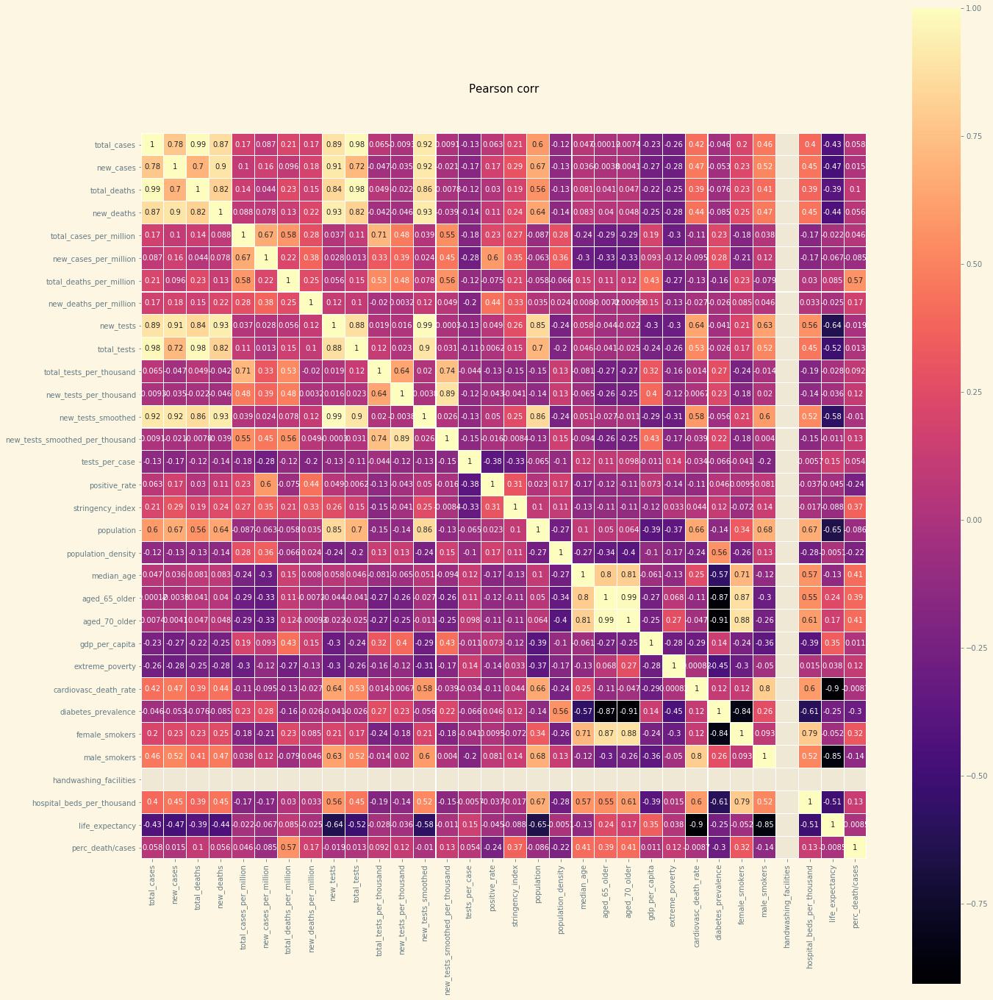

In [81]:
colormap=plt.cm.magma
f, ax = plt.subplots(figsize=(20,20))
plt.title("Pearson corr", y=1.05, size=15)
ax = sns.heatmap(df_most_test.corr(), linewidths=0.1, vmax=1.0, square=True, cmap=colormap, linecolor="white", annot=True)
plt.tight_layout()
plt.show()

In [82]:
# Lets graph the progress of the cases per million in the countries testing most

cases_weekly_top1 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_top_ten_testing_most[0]:
        two_weeks_cases = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=2)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_top_ten_testing_most[0]))]["new_cases_per_million"].sum()
        
        date = df.loc[i,"date"]
    
        cases_weekly_top1.append((date, two_weeks_cases))

cases_weekly_top2 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_top_ten_testing_most[1]:
        two_weeks_cases = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=2)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_top_ten_testing_most[1]))]["new_cases_per_million"].sum()
        
        date = df.loc[i,"date"]
    
        cases_weekly_top2.append((date, two_weeks_cases))
        
cases_weekly_top3 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_top_ten_testing_most[2]:
        two_weeks_cases = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=2)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_top_ten_testing_most[2]))]["new_cases_per_million"].sum()
        
        date = df.loc[i,"date"]
    
        cases_weekly_top3.append((date, two_weeks_cases))

cases_weekly_top4 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_top_ten_testing_most[3]:
        two_weeks_cases = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=2)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_top_ten_testing_most[3]))]["new_cases_per_million"].sum()
        
        date = df.loc[i,"date"]
    
        cases_weekly_top4.append((date, two_weeks_cases))

cases_weekly_top5 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_top_ten_testing_most[4]:
        two_weeks_cases = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=2)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_top_ten_testing_most[4]))]["new_cases_per_million"].sum()
        
        date = df.loc[i,"date"]
    
        cases_weekly_top5.append((date, two_weeks_cases))
        
cases_weekly_top6 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_top_ten_testing_most[5]:
        two_weeks_cases = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=2)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_top_ten_testing_most[5]))]["new_cases_per_million"].sum()
        
        date = df.loc[i,"date"]
    
        cases_weekly_top6.append((date, two_weeks_cases))

cases_weekly_top7 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_top_ten_testing_most[6]:
        two_weeks_cases = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=2)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_top_ten_testing_most[6]))]["new_cases_per_million"].sum()
        
        date = df.loc[i,"date"]
    
        cases_weekly_top7.append((date, two_weeks_cases))
        
cases_weekly_top8 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_top_ten_testing_most[7]:
        two_weeks_cases = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=2)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_top_ten_testing_most[7]))]["new_cases_per_million"].sum()
        
        date = df.loc[i,"date"]
    
        cases_weekly_top8.append((date, two_weeks_cases))

cases_weekly_top9 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_top_ten_testing_most[8]:
        two_weeks_cases = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=2)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_top_ten_testing_most[8]))]["new_cases_per_million"].sum()
        
        date = df.loc[i,"date"]
    
        cases_weekly_top9.append((date, two_weeks_cases))

cases_weekly_top10 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_top_ten_testing_most[9]:
        two_weeks_cases = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=2)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_top_ten_testing_most[9]))]["new_cases_per_million"].sum()
        
        date = df.loc[i,"date"]
    
        cases_weekly_top10.append((date, two_weeks_cases))
        
df_cases_weekly_top1 = pd.DataFrame(cases_weekly_top1, columns=["date", "cases_weekly"])
df_cases_weekly_top2 = pd.DataFrame(cases_weekly_top2, columns=["date", "cases_weekly"])
df_cases_weekly_top3 = pd.DataFrame(cases_weekly_top3, columns=["date", "cases_weekly"])
df_cases_weekly_top4 = pd.DataFrame(cases_weekly_top4, columns=["date", "cases_weekly"])
df_cases_weekly_top5 = pd.DataFrame(cases_weekly_top5, columns=["date", "cases_weekly"])
df_cases_weekly_top6 = pd.DataFrame(cases_weekly_top6, columns=["date", "cases_weekly"])
df_cases_weekly_top7 = pd.DataFrame(cases_weekly_top7, columns=["date", "cases_weekly"])
df_cases_weekly_top8 = pd.DataFrame(cases_weekly_top8, columns=["date", "cases_weekly"])
df_cases_weekly_top9 = pd.DataFrame(cases_weekly_top9, columns=["date", "cases_weekly"])
df_cases_weekly_top10 = pd.DataFrame(cases_weekly_top10, columns=["date", "cases_weekly"])

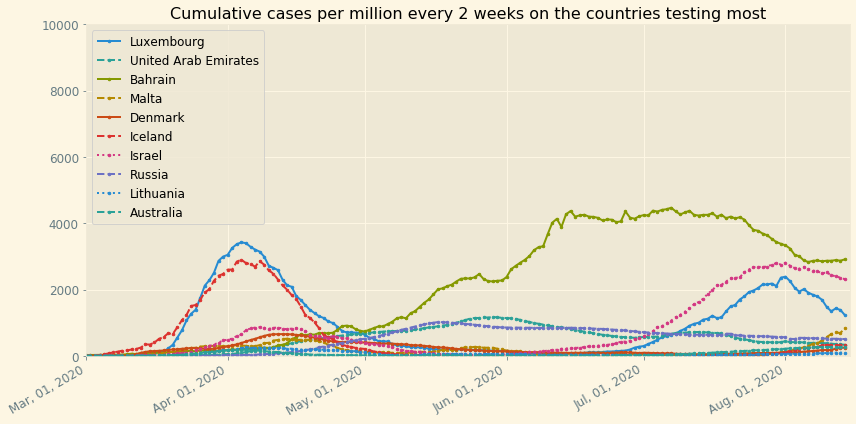

In [83]:
plt.rcParams["figure.figsize"] = (12,6)
plt.plot_date(df_cases_weekly_top1["date"], df_cases_weekly_top1["cases_weekly"], markersize=2.5, linewidth=2, linestyle='-')
plt.plot_date(df_cases_weekly_top2["date"], df_cases_weekly_top2["cases_weekly"], markersize=2.5, linewidth=2, linestyle='--')
plt.plot_date(df_cases_weekly_top3["date"], df_cases_weekly_top3["cases_weekly"], markersize=2.5, linewidth=2, linestyle='-')
plt.plot_date(df_cases_weekly_top4["date"], df_cases_weekly_top4["cases_weekly"], markersize=2.5, linewidth=2, linestyle='--')
plt.plot_date(df_cases_weekly_top5["date"], df_cases_weekly_top5["cases_weekly"], markersize=2.5, linewidth=2, linestyle='-')
plt.plot_date(df_cases_weekly_top6["date"], df_cases_weekly_top6["cases_weekly"], markersize=2.5, linewidth=2, linestyle='--')
plt.plot_date(df_cases_weekly_top7["date"], df_cases_weekly_top7["cases_weekly"], markersize=2.5, linewidth=2, linestyle=':')
plt.plot_date(df_cases_weekly_top8["date"], df_cases_weekly_top8["cases_weekly"], markersize=2.5, linewidth=2, linestyle='--')
plt.plot_date(df_cases_weekly_top9["date"], df_cases_weekly_top9["cases_weekly"], markersize=2.5, linewidth=2, linestyle=':')
plt.plot_date(df_cases_weekly_top10["date"], df_cases_weekly_top10["cases_weekly"], markersize=2.5, linewidth=2, linestyle='--')
plt.legend(list_top_ten_testing_most, scatterpoints=1, loc= "upper left", fontsize=12,  ncol=1)
plt.gcf().autofmt_xdate() # gcf (get current figure)
date_format = mpl_dates.DateFormatter("%b, %d, %Y")
plt.gca().xaxis.set_major_formatter(date_format)
plt.title("Cumulative cases per million every 2 weeks on the countries testing most", fontsize=16)
plt.xticks(rotation="30", fontsize=12)
plt.yticks(rotation="horizontal", fontsize=12)
tstart = datetime(2020,3,1)
tend = datetime.now()
plt.xlim([tstart, tend])
plt.ylim(0, 10000)
plt.tight_layout()
# plt.savefig("cumulative_cases_2W_per_million_hightesting.png")
plt.show()

In [84]:
# Lets graph the progress of the deaths per million in the countries testing most

deaths_weekly_top1 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_top_ten_testing_most[0]:
        two_weeks_deaths = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=2)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_top_ten_testing_most[0]))]["new_deaths_per_million"].sum()
        
        date = df.loc[i,"date"]
    
        deaths_weekly_top1.append((date, two_weeks_deaths))

deaths_weekly_top2 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_top_ten_testing_most[1]:
        two_weeks_deaths = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=2)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_top_ten_testing_most[1]))]["new_deaths_per_million"].sum()
        
        date = df.loc[i,"date"]
    
        deaths_weekly_top2.append((date, two_weeks_deaths))
        
deaths_weekly_top3 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_top_ten_testing_most[2]:
        two_weeks_deaths = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=2)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_top_ten_testing_most[2]))]["new_deaths_per_million"].sum()
        
        date = df.loc[i,"date"]
    
        deaths_weekly_top3.append((date, two_weeks_deaths))

deaths_weekly_top4 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_top_ten_testing_most[3]:
        two_weeks_deaths = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=2)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_top_ten_testing_most[3]))]["new_deaths_per_million"].sum()
        
        date = df.loc[i,"date"]
    
        deaths_weekly_top4.append((date, two_weeks_deaths))

deaths_weekly_top5 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_top_ten_testing_most[4]:
        two_weeks_deaths = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=2)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_top_ten_testing_most[4]))]["new_deaths_per_million"].sum()
        
        date = df.loc[i,"date"]
    
        deaths_weekly_top5.append((date, two_weeks_deaths))
        
deaths_weekly_top6 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_top_ten_testing_most[5]:
        two_weeks_deaths = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=2)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_top_ten_testing_most[5]))]["new_deaths_per_million"].sum()
        
        date = df.loc[i,"date"]
    
        deaths_weekly_top6.append((date, two_weeks_deaths))

deaths_weekly_top7 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_top_ten_testing_most[6]:
        two_weeks_deaths = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=2)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_top_ten_testing_most[6]))]["new_deaths_per_million"].sum()
        
        date = df.loc[i,"date"]
    
        deaths_weekly_top7.append((date, two_weeks_deaths))
        
deaths_weekly_top8 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_top_ten_testing_most[7]:
        two_weeks_deaths = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=2)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_top_ten_testing_most[7]))]["new_deaths_per_million"].sum()
        
        date = df.loc[i,"date"]
    
        deaths_weekly_top8.append((date, two_weeks_deaths))

deaths_weekly_top9 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_top_ten_testing_most[8]:
        two_weeks_deaths = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=2)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_top_ten_testing_most[8]))]["new_deaths_per_million"].sum()
        
        date = df.loc[i,"date"]
    
        deaths_weekly_top9.append((date, two_weeks_deaths))

deaths_weekly_top10 = []
for i in range(len(df)):
    if df.loc[i,"location"]==list_top_ten_testing_most[9]:
        two_weeks_deaths = df.loc[(((df["date"] >= (df.loc[i,"date"] - dateutil.relativedelta.relativedelta(weeks=2)))
            &(df["date"] < df.loc[i,"date"]))&(df["location"]==list_top_ten_testing_most[9]))]["new_deaths_per_million"].sum()
        
        date = df.loc[i,"date"]
    
        deaths_weekly_top10.append((date, two_weeks_deaths))
        
df_deaths_weekly_top1 = pd.DataFrame(deaths_weekly_top1, columns=["date", "deaths_weekly"])
df_deaths_weekly_top2 = pd.DataFrame(deaths_weekly_top2, columns=["date", "deaths_weekly"])
df_deaths_weekly_top3 = pd.DataFrame(deaths_weekly_top3, columns=["date", "deaths_weekly"])
df_deaths_weekly_top4 = pd.DataFrame(deaths_weekly_top4, columns=["date", "deaths_weekly"])
df_deaths_weekly_top5 = pd.DataFrame(deaths_weekly_top5, columns=["date", "deaths_weekly"])
df_deaths_weekly_top6 = pd.DataFrame(deaths_weekly_top6, columns=["date", "deaths_weekly"])
df_deaths_weekly_top7 = pd.DataFrame(deaths_weekly_top7, columns=["date", "deaths_weekly"])
df_deaths_weekly_top8 = pd.DataFrame(deaths_weekly_top8, columns=["date", "deaths_weekly"])
df_deaths_weekly_top9 = pd.DataFrame(deaths_weekly_top9, columns=["date", "deaths_weekly"])
df_deaths_weekly_top10 = pd.DataFrame(deaths_weekly_top10, columns=["date", "deaths_weekly"])

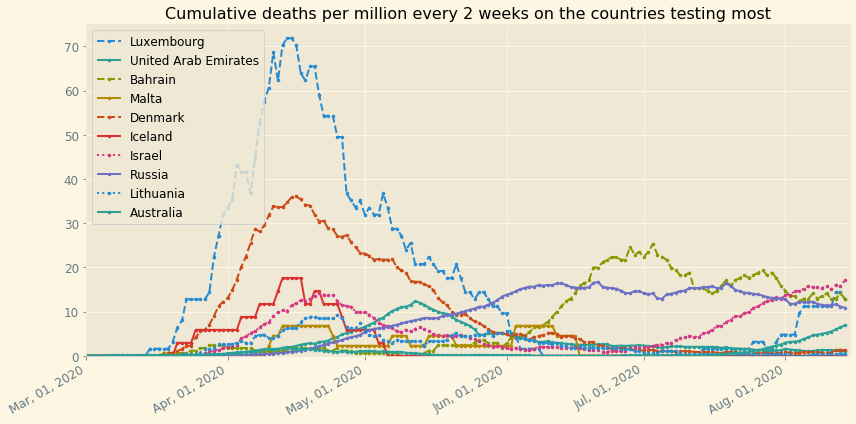

In [85]:
plt.rcParams["figure.figsize"] = (12,6)
plt.plot_date(df_deaths_weekly_top1["date"], df_deaths_weekly_top1["deaths_weekly"], markersize=2.5, linewidth=2, linestyle='--')
plt.plot_date(df_deaths_weekly_top2["date"], df_deaths_weekly_top2["deaths_weekly"], markersize=2.5, linewidth=2, linestyle='-')
plt.plot_date(df_deaths_weekly_top3["date"], df_deaths_weekly_top3["deaths_weekly"], markersize=2.5, linewidth=2, linestyle='--')
plt.plot_date(df_deaths_weekly_top4["date"], df_deaths_weekly_top4["deaths_weekly"], markersize=2.5, linewidth=2, linestyle='-')
plt.plot_date(df_deaths_weekly_top5["date"], df_deaths_weekly_top5["deaths_weekly"], markersize=2.5, linewidth=2, linestyle='--')
plt.plot_date(df_deaths_weekly_top6["date"], df_deaths_weekly_top6["deaths_weekly"], markersize=2.5, linewidth=2, linestyle='-')
plt.plot_date(df_deaths_weekly_top7["date"], df_deaths_weekly_top7["deaths_weekly"], markersize=2.5, linewidth=2, linestyle=':')
plt.plot_date(df_deaths_weekly_top8["date"], df_deaths_weekly_top8["deaths_weekly"], markersize=2.5, linewidth=2, linestyle='-')
plt.plot_date(df_deaths_weekly_top9["date"], df_deaths_weekly_top9["deaths_weekly"], markersize=2.5, linewidth=2, linestyle=':')
plt.plot_date(df_deaths_weekly_top10["date"], df_deaths_weekly_top10["deaths_weekly"], markersize=2.5, linewidth=2, linestyle='-')
plt.legend(list_top_ten_testing_most, scatterpoints=1, loc= "upper left", fontsize=12,  ncol=1)
plt.gcf().autofmt_xdate() # gcf (get current figure)
date_format = mpl_dates.DateFormatter("%b, %d, %Y")
plt.gca().xaxis.set_major_formatter(date_format)
plt.title("Cumulative deaths per million every 2 weeks on the countries testing most", fontsize=16)
plt.xticks(rotation="30", fontsize=12)
plt.yticks(rotation="horizontal", fontsize=12)
tstart = datetime(2020,3,1)
tend = datetime.now()
plt.xlim([tstart, tend])
plt.ylim(0, 75)
plt.tight_layout()
# plt.savefig("cumulative_deaths_2W_per_million_hightesting.png")
plt.show()

Overall, it seems that the countries where testing was greater, have managed to control so far the spread of the virus. This is a clear indication of the importance of performing tests to the population for the control of the virus.

Lets take a look to the death ratio (deaths/cases) in those countries

In [86]:
df_most_test["Percentage_death_cases"] = (df_most_test["total_deaths"]/df_most_test["total_cases"])*100

C:\Users\enriq\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [87]:
df_most_test = df_most_test.loc[df_most_test["date"] == df_most_test["date"].max()].sort_values(by="Percentage_death_cases", ascending=False)

In [88]:
df_most_test

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,total_deaths_per_million,new_deaths_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,tests_per_case,positive_rate,tests_units,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,perc_death/cases,Percentage_death_cases
9330,DNK,Europe,Denmark,2020-08-14,15214.0,144.0,621.0,0.0,2626.634,24.861,107.213,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5792203.0,136.520,42.3,19.677,12.325,46682.515,0.2,114.767,6.41,19.3,18.8,NaN,2.500,80.90,4.081767,4.081767
19975,LTU,Europe,Lithuania,2020-08-14,2330.0,21.0,81.0,0.0,855.897,7.714,29.754,0.000,4875.0,570657.0,209.624,1.791,3614.0,1.328,159.107,0.006,samples tested,NaN,2722291.0,45.135,43.5,19.002,13.778,29524.265,0.7,342.989,3.67,21.3,38.0,NaN,6.560,75.93,3.476395,3.476395
27719,RUS,Europe,Russia,2020-08-14,907758.0,5057.0,15384.0,124.0,6220.313,34.653,105.417,0.850,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,145934460.0,8.823,39.6,14.178,9.393,24765.954,0.1,431.297,6.18,23.4,58.3,NaN,8.050,72.58,1.694725,1.694725
20203,LUX,Europe,Luxembourg,2020-08-14,7368.0,68.0,122.0,0.0,11770.419,108.630,194.896,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,625976.0,231.447,39.7,14.312,9.842,94277.965,0.2,128.275,4.42,20.9,26.0,NaN,4.510,82.25,1.655809,1.655809
1966,AUS,Oceania,Australia,2020-08-14,22358.0,231.0,361.0,9.0,876.788,9.059,14.157,0.353,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25499881.0,3.202,37.9,15.504,10.129,44648.710,0.5,107.791,5.07,13.0,16.5,NaN,3.840,83.44,1.614635,1.614635
21422,MLT,Europe,Malta,2020-08-14,1144.0,55.0,9.0,0.0,2590.938,124.564,20.383,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,441539.0,1454.037,42.4,19.426,11.324,36513.323,0.2,168.711,8.83,20.9,30.2,NaN,4.485,82.53,0.786713,0.786713
16910,ISR,Asia,Israel,2020-08-14,89822.0,1268.0,651.0,12.0,10377.399,146.496,75.212,1.386,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8655541.0,402.606,30.6,11.733,7.359,33132.320,0.5,93.320,6.74,15.4,35.4,NaN,2.990,82.97,0.724767,0.724767
34510,ARE,Asia,United Arab Emirates,2020-08-14,63489.0,277.0,358.0,1.0,6419.255,28.007,36.197,0.101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9890400.0,112.442,34.0,1.144,0.526,67293.483,NaN,317.840,17.26,1.2,37.4,NaN,1.200,77.97,0.563877,0.563877
15407,ISL,Europe,Iceland,2020-08-14,1976.0,4.0,10.0,0.0,5790.476,11.722,29.304,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,341250.0,3.404,37.3,14.431,9.207,46482.958,0.2,117.992,5.31,14.3,15.2,NaN,2.910,82.99,0.506073,0.506073
2792,BHR,Asia,Bahrain,2020-08-14,45726.0,462.0,167.0,1.0,26872.624,271.512,98.144,0.588,NaN,944798.0,555.246,NaN,9728.0,5.717,24.003,0.042,units unclear,NaN,1701583.0,1935.907,32.4,2.372,1.387,43290.705,NaN,151.689,16.52,5.8,37.6,NaN,2.000,77.29,0.365219,0.365219


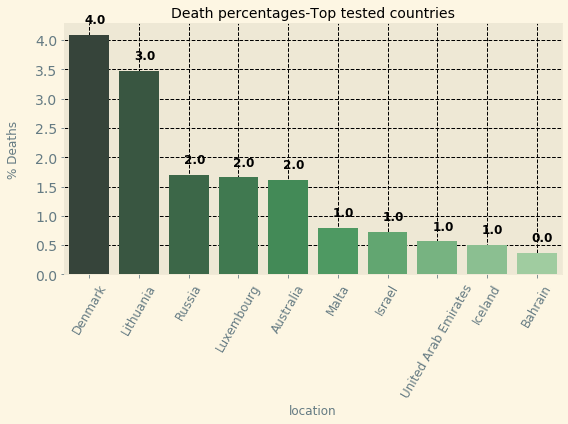

In [89]:
plt.rcParams["figure.figsize"] = (8,6)

x = [-0.1, 0.9, 1.9, 2.9, 3.9, 4.9, 5.9, 6.9, 7.9, 8.9, 9.9, 10.9, 11.9]
y = list(df_most_test["Percentage_death_cases"])
countries = df_most_test["location"]
sns.barplot(x=df_most_test["location"],y=df_most_test["Percentage_death_cases"], data=df_most_test, palette="Greens_d")
plt.title("Death percentages-Top tested countries", fontsize=14)
plt.ylabel("% Deaths",  labelpad=15, fontsize=12)
plt.xticks(rotation="60", fontsize=12)
plt.yticks(rotation="horizontal", fontsize=14)
#plt.legend(df7["location"], loc="upper right")
plt.grid(color="k", linestyle="--")

for i, label in enumerate((df_most_test["Percentage_death_cases"].round())):
    plt.text(x[i]-0.0, y[i]+0.2, label, fontsize=12, fontweight='bold')
                          
plt.tight_layout()
# plt.savefig("death_perc_hightesting.png")
plt.show()

Indeed, low rates can be expected in those countries where testing is widely used

This dataset has provided us with some helpful insights into this pandemia. There is however an important piece of information missing, which is the recovery rates in each country. This is important because it gives us information about the stage of the pandemia in each country. For instance, countries with high recovery rates will likely experience a slow down in the number of infections, unlike in countries where most of cases are still active. To get this information I used the data available at https://www.worldometers.info/coronavirus/

In [90]:
df2 = pd.read_csv("worldometers.csv", parse_dates=True, encoding= 'unicode_escape')

In [91]:
df2.columns

Index(['#', 'Country, Other', 'Total Cases', 'New Cases', 'Total Deaths',
       'New Deaths', 'Total Recovered', 'Active Cases', 'Serious, Critical',
       'Tot Cases/ 1M pop', 'Deaths/ 1M pop', 'Total Tests', 'Tests/ \n1M pop',
       'Population'],
      dtype='object')

In [92]:
df2.drop('#', inplace=True, axis=1)

In [93]:
df2["Total Recovered"] = df2["Total Recovered"].str.replace(",","")

In [94]:
df2["Total Recovered"] = df2["Total Recovered"].astype("float")

In [95]:
df2.dtypes

Country, Other        object
Total Cases            int64
New Cases            float64
Total Deaths         float64
New Deaths           float64
Total Recovered      float64
Active Cases          object
Serious, Critical    float64
Tot Cases/ 1M pop    float64
Deaths/ 1M pop       float64
Total Tests          float64
Tests/ \n1M pop      float64
Population           float64
dtype: object

In [96]:
df2["recovery_rate"] = (df2["Total Recovered"]/df2["Total Cases"])*100

In [97]:
df2

,"Country, Other",Total Cases,New Cases,Total Deaths,New Deaths,Total Recovered,Active Cases,"Serious, Critical",Tot Cases/ 1M pop,Deaths/ 1M pop,Total Tests,Tests/ \n1M pop,Population,recovery_rate
0,World,21306726,247449.0,761802.0,5083.0,14108439.0,"6,436,485",64519.0,2733.0,97.7,NaN,NaN,NaN,66.215894
1,North America,6443073,68208.0,244164.0,1740.0,3506071.0,"2,692,838",24257.0,NaN,NaN,NaN,NaN,NaN,54.416130
2,Asia,5485452,93240.0,117092.0,1457.0,4195027.0,"1,173,333",18996.0,NaN,NaN,NaN,NaN,NaN,76.475503
3,USA,5471948,56282.0,171433.0,1018.0,2866186.0,"2,434,329",17216.0,16520.0,518.0,69333768.0,209319.0,331235184.0,52.379628
4,South America,5123511,50526.0,172506.0,1145.0,3687811.0,"1,263,194",14840.0,NaN,NaN,NaN,NaN,NaN,71.978200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
226,Total:,3128427,23118.0,202492.0,322.0,1891128.0,"1,034,807",5183.0,NaN,NaN,NaN,NaN,NaN,60.449804
227,Total:,1100736,11959.0,25132.0,405.0,812686.0,"262,918",1190.0,NaN,NaN,NaN,NaN,NaN,73.831146
228,Total:,24806,398.0,401.0,14.0,15065.0,"9,340",49.0,NaN,NaN,NaN,NaN,NaN,60.731275
229,Total:,721,NaN,15.0,NaN,651.0,55,4.0,NaN,NaN,NaN,NaN,NaN,90.291262


In [98]:
df2 = df2.loc[~(df2["Country, Other"] == "Total:")]

In [99]:
df_continents = df2.loc[(df2["Total Cases"]>df2["Total Cases"].mean())&(~(df2["Country, Other"].isin(["World", "North America","South America","Europe","Africa","Asia"])))]

In [100]:
df_countries = df2.loc[(df2["Total Cases"]>df2["Total Cases"].mean())&(~(df2["Country, Other"].isin(["World", "North America","South America","Europe","Africa","Asia"])))]

In [101]:
df_countries.reset_index(inplace=True)

In [102]:
df_countries.drop("index", axis=1, inplace=True)

C:\Users\enriq\Anaconda3\lib\site-packages\pandas\core\frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [103]:
df_countries = df_countries.sort_values(by="recovery_rate", ascending=False).dropna(how="any", subset=["recovery_rate"])

In [104]:
df_countries

,"Country, Other",Total Cases,New Cases,Total Deaths,New Deaths,Total Recovered,Active Cases,"Serious, Critical",Tot Cases/ 1M pop,Deaths/ 1M pop,Total Tests,Tests/ \n1M pop,Population,recovery_rate
8,Chile,382111,2077.0,10340.0,41.0,355037.0,"16,734",1252.0,19969.0,540.0,1960210.0,102438.0,1.913565e+07,92.914624
13,Pakistan,287300,626.0,6153.0,14.0,265215.0,"15,932",774.0,1298.0,28.0,2229409.0,10071.0,2.213780e+08,92.312913
12,Saudi Arabia,295902,1383.0,3338.0,35.0,262959.0,"29,605",1782.0,8484.0,96.0,4071857.0,116751.0,3.487630e+07,88.866922
10,Iran,338825,2501.0,19331.0,169.0,293811.0,"25,683",3956.0,4028.0,230.0,2812488.0,33435.0,8.411818e+07,86.714676
4,South Africa,579140,6275.0,11556.0,286.0,461734.0,"105,850",539.0,9751.0,195.0,3351111.0,56420.0,5.939587e+07,79.727527
3,Russia,912823,5065.0,15498.0,114.0,722964.0,"174,361",2300.0,6255.0,106.0,31903055.0,218601.0,1.459421e+08,79.200897
1,Brazil,3275520,45899.0,106523.0,959.0,2384302.0,"784,695",8318.0,15397.0,501.0,13464336.0,63290.0,2.127395e+08,72.791557
2,India,2525222,65609.0,49134.0,990.0,1807556.0,"668,532",8944.0,1828.0,36.0,27694416.0,20045.0,1.381604e+09,71.580083
5,Peru,507996,NaN,25648.0,NaN,348006.0,"134,342",1525.0,15382.0,777.0,2677014.0,81060.0,3.302511e+07,68.505658
6,Mexico,505751,7371.0,55293.0,627.0,341507.0,"108,951",3675.0,3918.0,428.0,1142045.0,8847.0,1.290921e+08,67.524731


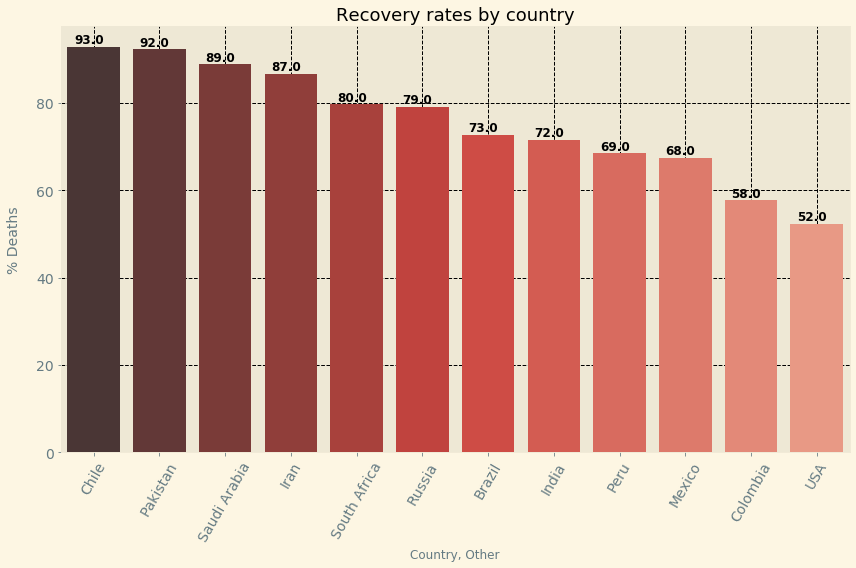

In [105]:
plt.rcParams["figure.figsize"] = (12,8)
x = [-0.1, 0.9, 1.9, 2.9, 3.9, 4.9, 5.9, 6.9, 7.9, 8.9, 9.9, 10.9, 11.9,12.9, 13.9, 14.9, 15.9]
y = list(df_countries["recovery_rate"])
countries = df_countries["Country, Other"]
sns.barplot(x=df_countries["Country, Other"],y=df_countries["recovery_rate"], data=df_countries, palette="Reds_d")

plt.title("Recovery rates by country", fontsize=18)
plt.ylabel("% Deaths",  labelpad=15, fontsize=14)
plt.xticks(rotation="60", fontsize=14)
plt.yticks(rotation="horizontal", fontsize=14)
#plt.legend(df7["location"], loc="upper right")
plt.grid(color="k", linestyle="--")

for i, label in enumerate((df_countries["recovery_rate"]).round()):
    plt.text(x[i]-0.2, y[i]+0.8, label, fontsize=12, fontweight='bold')
plt.tight_layout()
# plt.savefig("recovery_rates.png")

These results indicate that number of deaths may increase in the coming weeks-days in Peru, Brazil, Mexico, India, South Africa, Colombia and USA since the recovery rates are still low in those countries. Next I will further investigate in what countries the increase in cases is currently more pronounce, and compare it to the recovery rates.

In [106]:
df

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,total_deaths_per_million,new_deaths_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,tests_per_case,positive_rate,tests_units,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,perc_death/cases
0,AFG,Asia,Afghanistan,2019-12-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.000000
1,AFG,Asia,Afghanistan,2020-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.000000
2,AFG,Asia,Afghanistan,2020-01-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.000000
3,AFG,Asia,Afghanistan,2020-01-03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.000000
4,AFG,Asia,Afghanistan,2020-01-04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36769,NaN,NaN,International,2020-02-28,705.0,0.0,4.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.567376
36770,NaN,NaN,International,2020-02-29,705.0,0.0,6.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.851064
36771,NaN,NaN,International,2020-03-01,705.0,0.0,6.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.851064
36772,NaN,NaN,International,2020-03-02,705.0,0.0,6.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.851064


In [107]:
new_cases_last_2_weeks = []
for i in df["location"].unique():
    data_cases = df.loc[(df["date"] >= df["date"].max() - dateutil.relativedelta.relativedelta(weeks=2))&(df["date"] < df["date"].max())&(df["location"] == i)]["new_cases_per_million"].sum()
    data_total_cases = df.loc[(df["date"] >= df["date"].max() - dateutil.relativedelta.relativedelta(weeks=2))&(df["date"] < df["date"].max())&(df["location"] == i)]["total_cases"].max()
    new_cases_last_2_weeks.append((i, data_cases, data_total_cases))

In [108]:
new_cases_per_million_last_2_weeks = pd.DataFrame(new_cases_last_2_weeks, columns=["location","cases","total_cases"])

In [109]:
new_cases_per_million_last_2_weeks = new_cases_per_million_last_2_weeks.loc[new_cases_per_million_last_2_weeks["total_cases"]>new_cases_per_million_last_2_weeks["total_cases"].mean()]

In [110]:
new_cases_per_million_last_2_weeks.sort_values(by="cases", ascending=False, inplace=True)

In [111]:
new_cases_per_million_last_2_weeks.reset_index(inplace=True)

In [112]:
new_cases_per_million_last_2_weeks.drop("index", axis=1, inplace=True)

In [113]:
top15_most_affected_now = new_cases_per_million_last_2_weeks[:15]

In [114]:
top15_most_affected_now

,location,cases,total_cases
0,Peru,2968.351,498555.0
1,Brazil,2881.640,3164785.0
2,Colombia,2878.454,422519.0
3,United States,2326.767,5197148.0
4,Argentina,1937.261,260898.0
5,South Africa,1648.931,568919.0
6,Chile,1391.124,378168.0
7,Spain,1110.132,337334.0
8,Mexico,697.504,498380.0
9,India,589.016,2396637.0


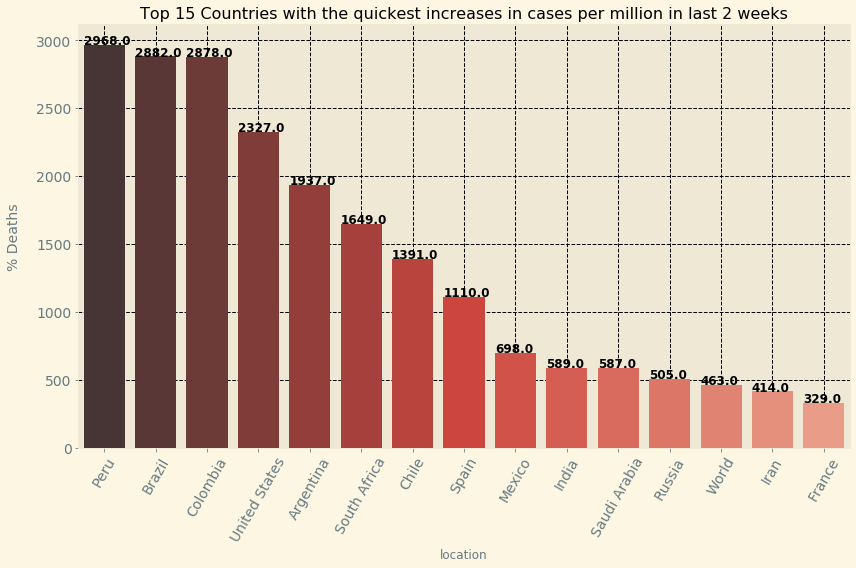

In [115]:
plt.rcParams["figure.figsize"] = (12,8)
x = [-0.1, 0.9, 1.9, 2.9, 3.9, 4.9, 5.9, 6.9, 7.9, 8.9, 9.9, 10.9, 11.9,12.9, 13.9, 14.9, 15.9]
y = list(top15_most_affected_now["cases"])
countries = top15_most_affected_now["location"]
sns.barplot(x=top15_most_affected_now["location"],y=top15_most_affected_now["cases"], data=top15_most_affected_now, palette="Reds_d")

plt.title("Top 15 Countries with the quickest increases in cases per million in last 2 weeks", fontsize=16)
plt.ylabel("% Deaths",  labelpad=15, fontsize=14)
plt.xticks(rotation="60", fontsize=14)
plt.yticks(rotation="horizontal", fontsize=14)
#plt.legend(df7["location"], loc="upper right")
plt.grid(color="k", linestyle="--")

for i, label in enumerate((top15_most_affected_now["cases"]).round(0)):
    plt.text(x[i]-0.3, y[i]+2, label, fontsize=12, fontweight='bold')
plt.tight_layout()
# plt.savefig("countries_highest_increase_currently.png")

USA, Colombia, South Africa, India, Mexico, Brazil and Peru were the countries were the countries with the lowest recovery rates, and these are also the countries with highest cases recorded in the last two weeks, which confirms that the virus is spreading fastest in these countries

In [116]:
new_cases_per_million_last_2_weeks.loc[:20]

,location,cases,total_cases
0,Peru,2968.351,498555.0
1,Brazil,2881.640,3164785.0
2,Colombia,2878.454,422519.0
3,United States,2326.767,5197148.0
4,Argentina,1937.261,260898.0
5,South Africa,1648.931,568919.0
6,Chile,1391.124,378168.0
7,Spain,1110.132,337334.0
8,Mexico,697.504,498380.0
9,India,589.016,2396637.0


To conclude this EDA project I will be generate some interactive Data Visualizations with bokeh and plotly to get a feeling of how covid has spread around the world.
In particular I will plot:

* Total tests (per 1000 people) vs GDP per capita
* Total cases vs total deaths
* Total cases per million vs total deaths per million

per country

In [117]:
df.columns

Index(['iso_code', 'continent', 'location', 'date', 'total_cases', 'new_cases',
       'total_deaths', 'new_deaths', 'total_cases_per_million',
       'new_cases_per_million', 'total_deaths_per_million',
       'new_deaths_per_million', 'new_tests', 'total_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'tests_per_case', 'positive_rate', 'tests_units', 'stringency_index',
       'population', 'population_density', 'median_age', 'aged_65_older',
       'aged_70_older', 'gdp_per_capita', 'extreme_poverty',
       'cardiovasc_death_rate', 'diabetes_prevalence', 'female_smokers',
       'male_smokers', 'handwashing_facilities', 'hospital_beds_per_thousand',
       'life_expectancy', 'perc_death/cases'],
      dtype='object')

In [118]:
pivot_countries = pd.pivot_table(df, index=["location","continent"], values=['total_cases', 'new_cases',
       'total_deaths', 'new_deaths', 'total_cases_per_million',
       'new_cases_per_million', 'total_deaths_per_million',
       'new_deaths_per_million', 'new_tests', 'total_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand', 'tests_units',
       'stringency_index', 'population', 'population_density', 'median_age',
       'aged_65_older', 'aged_70_older', 'gdp_per_capita', 'extreme_poverty',
       'cardiovasc_death_rate', 'diabetes_prevalence', 'female_smokers',
       'male_smokers', 'handwashing_facilities', 'hospital_beds_per_thousand',
       'life_expectancy', 'perc_death/cases'], 
                          aggfunc=["max"]).reset_index()

In [119]:
pivot_countries

location continent           max                \
                              aged_65_older aged_70_older   
0       Afghanistan      Asia         2.581         1.337   
1           Albania    Europe        13.188         8.643   
2           Algeria    Africa         6.211         3.857   
3           Andorra    Europe           NaN           NaN   
4            Angola    Africa         2.405         1.362   
..              ...       ...           ...           ...   
205         Vietnam      Asia         7.150         4.718   
206  Western Sahara    Africa           NaN         1.380   
207           Yemen      Asia         2.922         1.583   
208          Zambia    Africa         2.480         1.542   
209        Zimbabwe    Africa         2.822         1.882   

                                                                              \
    cardiovasc_death_rate diabetes_prevalence extreme_poverty female_smokers   
0                 597.029                9.59             NaN            NaN   
1                 304.195               10.08             1.1            7.1   
2                 278.364                6.73             0.5            0.7   
3                 109.135                7.97             NaN           29.0   
4                 276.045                3.94             NaN            NaN   
..                    ...                 ...             ...            ...   
205               245.465                6.00             2.0            1.0   
206                   NaN                 NaN             NaN            NaN   
207               495.003                5.35            18.8            7.6   
208               234.499                3.94            57.5            3.1   
209               307.846                1.82            21.4            1.6   

                                                                      \
    gdp_per_capita handwashing_facilities hospital_beds_per_thousand   
0         1803.987                 37.746                       0.50   
1        11803.431                    NaN                       2.89   
2        13913.839                 83.741                       1.90   
3              NaN                    NaN                        NaN   
4         5819.495                 26.664                        NaN   
..             ...                    ...                        ...   
205       6171.884                 85.847                       2.60   
206            NaN                    NaN                        NaN   
207       1479.147                 49.542                       0.70   
208       3689.251                 13.938                       2.00   
209       1899.775                 36.791                       1.70   

                                                                             \
    life_expectancy male_smokers median_age new_cases new_cases_per_million   
0             64.83          NaN       18.6    1063.0                27.307   
1             78.57         51.2       38.0     154.0                53.513   
2             76.88         30.4       29.1     675.0                15.393   
3             83.73         37.8        NaN      79.0              1022.455   
4             61.15          NaN       16.8     180.0                 5.477   
..              ...          ...        ...       ...                   ...   
205           75.40         45.9       32.6      50.0                 0.514   
206           70.26          NaN       28.4     242.0               405.136   
207           66.12         29.2       20.3     116.0                 3.889   
208           63.89         24.7       17.7     527.0                28.666   
209           61.49         30.7       19.6     490.0                32.968   

                                                                        \
    new_deaths new_deaths_per_million new_tests new_tests_per_thousand   
0         56.0                  1.439       NaN                

In [120]:
pivot_countries.columns

MultiIndex([( 'location',                                ''),
            ('continent',                                ''),
            (      'max',                   'aged_65_older'),
            (      'max',                   'aged_70_older'),
            (      'max',           'cardiovasc_death_rate'),
            (      'max',             'diabetes_prevalence'),
            (      'max',                 'extreme_poverty'),
            (      'max',                  'female_smokers'),
            (      'max',                  'gdp_per_capita'),
            (      'max',          'handwashing_facilities'),
            (      'max',      'hospital_beds_per_thousand'),
            (      'max',                 'life_expectancy'),
            (      'max',                    'male_smokers'),
            (      'max',                      'median_age'),
            (      'max',                       'new_cases'),
            (      'max',           'new_cases_per_million'),
        

In [121]:
pivot_countries.isna().sum()

location                                        0
continent                                       0
max        aged_65_older                       27
           aged_70_older                       25
           cardiovasc_death_rate               25
           diabetes_prevalence                 17
           extreme_poverty                     89
           female_smokers                      70
           gdp_per_capita                      27
           handwashing_facilities             119
           hospital_beds_per_thousand          46
           life_expectancy                      3
           male_smokers                        72
           median_age                          24
           new_cases                            1
           new_cases_per_million                1
           new_deaths                           1
           new_deaths_per_million               1
           new_tests                          123
           new_tests_per_thousand             123


In [122]:
column_names = []
for i in range(len(pivot_countries.columns)):
    column_names.append(pivot_countries.columns[i][1])

In [123]:
column_names[0] = "location"
column_names[1] = "continent"

In [124]:
pivot_countries.columns = column_names

In [125]:
pivot_countries.isna().sum()

location                             0
continent                            0
aged_65_older                       27
aged_70_older                       25
cardiovasc_death_rate               25
diabetes_prevalence                 17
extreme_poverty                     89
female_smokers                      70
gdp_per_capita                      27
handwashing_facilities             119
hospital_beds_per_thousand          46
life_expectancy                      3
male_smokers                        72
median_age                          24
new_cases                            1
new_cases_per_million                1
new_deaths                           1
new_deaths_per_million               1
new_tests                          123
new_tests_per_thousand             123
new_tests_smoothed                 117
new_tests_smoothed_per_thousand    117
perc_death/cases                     0
population                           0
population_density                  11
stringency_index         

In [126]:
pivot_countries.dropna(how="any", subset = ["total_tests"], inplace=True)

In [127]:
pivot_countries.drop(["handwashing_facilities", "extreme_poverty", "new_tests", "new_tests_per_thousand"], axis=1, inplace=True)

In [128]:
pivot_countries.isna().sum()

location                           0
continent                          0
aged_65_older                      1
aged_70_older                      1
cardiovasc_death_rate              1
diabetes_prevalence                1
female_smokers                     4
gdp_per_capita                     2
hospital_beds_per_thousand         7
life_expectancy                    0
male_smokers                       5
median_age                         0
new_cases                          1
new_cases_per_million              1
new_deaths                         1
new_deaths_per_million             1
new_tests_smoothed                 0
new_tests_smoothed_per_thousand    0
perc_death/cases                   0
population                         0
population_density                 1
stringency_index                   2
total_cases                        1
total_cases_per_million            1
total_deaths                       1
total_deaths_per_million           1
total_tests                        0
t

In [129]:
pivot_countries.dropna(how="any", inplace=True)

In [130]:
pivot_countries = pivot_countries.reset_index().drop("index", axis=1)

In [131]:
country_list = pivot_countries["location"].unique().tolist()
continent_list = pivot_countries["continent"].unique().tolist()

In [132]:
from bokeh.io import curdoc, output_notebook
from bokeh.plotting import figure, show
from bokeh.models import HoverTool, ColumnDataSource, CategoricalColorMapper, Slider
from bokeh.palettes import Spectral6
from bokeh.layouts import widgetbox, row
from bokeh.transform import factor_cmap

from bokeh.models.widgets import DateSlider
from bokeh.layouts import layout

In [133]:
# This is what enables the plot to be displayed within the notebook
output_notebook()

Loading BokehJS ...

In [134]:
pivot_countries

,location,continent,aged_65_older,aged_70_older,cardiovasc_death_rate,diabetes_prevalence,female_smokers,gdp_per_capita,hospital_beds_per_thousand,life_expectancy,male_smokers,median_age,new_cases,new_cases_per_million,new_deaths,new_deaths_per_million,new_tests_smoothed,new_tests_smoothed_per_thousand,perc_death/cases,population,population_density,stringency_index,total_cases,total_cases_per_million,total_deaths,total_deaths_per_million,total_tests,total_tests_per_thousand
0,Argentina,South America,11.198,7.441,191.032,5.50,16.2,18933.907,5.000,76.67,27.7,31.9,9006.0,199.266,303.0,6.704,14190.0,0.314,11.111111,4.519578e+07,16.177,100.00,268561.0,5942.170,5246.0,116.073,793114.0,17.548
1,Australia,Oceania,15.504,10.129,107.791,5.07,13.0,44648.710,3.840,83.44,16.5,37.9,721.0,28.275,21.0,0.824,79961.0,3.136,4.054054,2.549988e+07,3.202,79.17,22358.0,876.788,361.0,14.157,5109785.0,200.385
2,Austria,Europe,19.202,13.748,145.183,6.35,28.4,45436.686,7.370,81.54,30.9,44.4,1141.0,126.688,31.0,3.442,14241.0,1.581,4.037962,9.006400e+06,106.749,85.19,22730.0,2523.761,725.0,80.498,991508.0,110.089
3,Bahrain,Asia,2.372,1.387,151.689,16.52,5.8,43290.705,2.000,77.29,37.6,32.4,1046.0,614.722,7.0,4.114,10931.0,6.424,0.873362,1.701583e+06,1935.907,78.70,45726.0,26872.624,167.0,98.144,944798.0,555.246
4,Bangladesh,Asia,5.098,3.262,298.003,8.38,1.0,3523.984,0.800,72.59,44.7,27.5,4019.0,24.404,64.0,0.389,17751.0,0.108,12.820513,1.646894e+08,1265.036,93.52,269115.0,1634.076,3557.0,21.598,1273168.0,7.731
5,Belarus,Europe,14.799,9.788,443.129,5.18,10.5,17167.967,11.000,74.79,46.1,40.3,973.0,102.970,11.0,1.164,18389.0,1.946,1.857143,9.449321e+06,46.858,19.44,69203.0,7323.595,599.0,63.391,1384026.0,146.468
6,Belgium,Europe,18.571,12.849,114.898,4.29,25.1,42658.576,5.640,81.63,31.4,41.8,2319.0,200.093,342.0,29.509,21155.0,1.825,16.267430,1.158962e+07,375.564,81.48,76098.0,6566.050,9916.0,855.593,1923861.0,165.999
7,Brazil,South America,8.552,5.060,177.961,8.11,10.1,14103.452,2.200,75.88,17.9,33.5,69074.0,324.963,1595.0,7.504,50375.0,0.237,6.993168,2.125594e+08,25.040,81.02,3224876.0,15171.645,105463.0,496.158,2536552.0,11.933
8,Bulgaria,Europe,20.801,13.272,424.688,5.81,30.1,18563.307,7.454,75.05,44.4,44.7,330.0,47.493,16.0,2.303,5673.0,0.816,14.285714,6.948445e+06,65.180,73.15,14069.0,2024.770,484.0,69.656,324851.0,46.752
9,Canada,North America,16.984,10.797,105.599,7.37,12.0,44017.591,2.500,82.43,16.6,41.4,2760.0,73.128,222.0,5.882,54505.0,1.444,8.326073,3.774216e+07,4.037,74.54,121234.0,3212.164,9015.0,238.858,4635105.0,122.810


In [135]:
# Using CategoricalColorMapper to assign a color from the Spectral6 package to the different countries:
color_mapper = CategoricalColorMapper(factors=continent_list,palette=Spectral6)

In [136]:
# making the data source for the plot.
source = ColumnDataSource(data={
'x': pivot_countries["total_tests_per_thousand"],
'y': pivot_countries["gdp_per_capita"],
'country': pivot_countries["location"],
'region' : pivot_countries["continent"],
'life':pivot_countries["life_expectancy"]
})

In [137]:
# Store the minimum and maximum GDP values and total_tests_per_1000 as xmin, ymin and xmax, ymax respectively:
ymin, ymax = min(pivot_countries["gdp_per_capita"]), max(pivot_countries["gdp_per_capita"])
xmin, xmax = min(pivot_countries["total_tests_per_thousand"]), max(pivot_countries["total_tests_per_thousand"])

In [138]:
# Create the plot:

plot = figure(title='GDP vs Tests',
plot_height=600, plot_width=1000,
x_range=(xmin, xmax),
y_range=(ymin, ymax)) 
# y_axis_type='log')

plot.circle(x='x', y='y', radius = 6, fill_alpha=0.8, source=source,
legend_field='region', color=dict(field='region', transform=color_mapper),
size=7)

hover = HoverTool(tooltips=[('Country', '@country'), ('Total tests per 1000', '@x'),
('GDP per capita', '@y'), ('Life Expectancy','@life')])
plot.add_tools(hover)

plot.legend.location = 'bottom_right'
plot.xaxis.axis_label = 'Total tests Per 1000'
plot.yaxis.axis_label = 'Income Per Person'
show(plot)

In [139]:
df_nonan = df[["continent", "location","date","total_cases","total_deaths","total_cases_per_million", "total_deaths_per_million", "life_expectancy", "perc_death/cases"]]

In [140]:
df_nonan.loc[df_nonan["continent"].isnull(),"continent"] = "World"

C:\Users\enriq\Anaconda3\lib\site-packages\pandas\core\indexing.py:966: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


In [141]:
df_nonan.dropna(how="any", inplace=True)

C:\Users\enriq\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [142]:
df_nonan.columns

Index(['continent', 'location', 'date', 'total_cases', 'total_deaths',
       'total_cases_per_million', 'total_deaths_per_million',
       'life_expectancy', 'perc_death/cases'],
      dtype='object')

In [143]:
df_nonan = df_nonan.reset_index().drop("index", axis=1)

In [144]:
countries_list = df_nonan["location"].unique().tolist()
region_list = df_nonan["continent"].unique().tolist()

In [145]:
# Using CategoricalColorMapper to assign a color from the Spectral6 package to the different countries:
color_mapper = CategoricalColorMapper(factors=region_list,palette=Spectral6)

C:\Users\enriq\Anaconda3\lib\site-packages\bokeh\models\mappers.py:147: UserWarning: Palette length does not match number of factors. ['World'] will be assigned to `nan_color` gray
  warnings.warn("Palette length does not match number of factors. %s will be assigned to `nan_color` %s" % (extra_factors, self.nan_color))


In [146]:
# making the data source for the plot.
source = ColumnDataSource(data={
'x': df_nonan["total_cases"].loc[df_nonan["date"] == "2020-7-26"],
'y': df_nonan["total_deaths"].loc[df_nonan["date"] == "2020-7-26"],
'country': df_nonan["location"].loc[df_nonan["date"] == "2020-7-26"],
'region' : df_nonan["continent"].loc[df_nonan["date"] == "2020-7-26"],
'percentagedeaths':df_nonan["perc_death/cases"].loc[df_nonan['date'] == "2020-7-26"],
'life':df_nonan["life_expectancy"].loc[df_nonan['date'] == "2020-7-26"]
})

In [147]:
df_nonan.head()

,continent,location,date,total_cases,total_deaths,total_cases_per_million,total_deaths_per_million,life_expectancy,perc_death/cases
0,Asia,Afghanistan,2019-12-31,0.0,0.0,0.0,0.0,64.83,0.0
1,Asia,Afghanistan,2020-01-01,0.0,0.0,0.0,0.0,64.83,0.0
2,Asia,Afghanistan,2020-01-02,0.0,0.0,0.0,0.0,64.83,0.0
3,Asia,Afghanistan,2020-01-03,0.0,0.0,0.0,0.0,64.83,0.0
4,Asia,Afghanistan,2020-01-04,0.0,0.0,0.0,0.0,64.83,0.0


In [148]:
# Store the minimum and maximum values as xmin, ymin and xmax, ymax respectively:
xmin, xmax = min(df_nonan["total_cases"]), max(df_nonan["total_cases"])
ymin, ymax = min(df_nonan["total_deaths"]), max(df_nonan["total_deaths"])

In [149]:
from datetime import date,datetime, timedelta

In [150]:
slider = DateSlider(title="Date Range: ", start=date(2019, 12, 31), end=date.today(), value=date(2020, 3, 1), step=1)

def update_plot(attr, old, new):
    yr = slider.value
    new_data = {
    'x': df_nonan["total_cases"].loc[df_nonan['date'] == yr],
    'y': df_nonan["total_deaths"].loc[df_nonan['date'] == yr],
    'country': df_nonan["location"].loc[df_nonan['date'] == yr],
    'region': df_nonan["continent"].loc[df_nonan['date'] == yr],
    'percentagedeaths':df_nonan["perc_death/cases"].loc[df_nonan['date'] == yr]
    }
    source.data = new_data
    plot.title.text = 'Total cases vs Total Deaths in %d' % yr

In [151]:
# Create the empty figure:

plot = figure(title='Total Cases vs Total Deaths',
plot_height=600, plot_width=1000,
x_range=(xmin, xmax),
y_range=(ymin, ymax)) 
# y_axis_type='log')

plot.circle(x='x', y='y', radius = 120000, fill_alpha=0.8, source=source,
legend_field='region', color=dict(field='region', transform=color_mapper),
size=7)

slider.on_change('value', update_plot)
layout = row(bokeh.models.Column(slider), plot)
curdoc().add_root(layout)

hover = HoverTool(tooltips=[('Country', '@country'), ('Total cases', '@x'),
('Total Deaths', '@y'), ('Percentage deaths','@percentagedeaths'), ('Life Expectancy','@life')])
                  
plot.add_tools(hover)

plot.legend.location = 'bottom_right'
plot.xaxis.axis_label = 'Total Cases'
plot.yaxis.axis_label = 'Total Deaths'
show(plot)

In [152]:
# Go back to cmd or your Terminal and traverse to the folder that contains this
# Jupyter notebook. Type the following command and wait until the plot is displayed
# in your web browser:
# bokeh serve --show name_of_your_notebook.ipynb


In [153]:
populated_countries = pivot_countries.loc[pivot_countries["population"]>10000000]

In [154]:
populated_countries_list = populated_countries["location"].unique().tolist()

In [155]:
df_nonan["date"] = df_nonan["date"].astype("str")

In [156]:
df_nonan_pop = df_nonan.loc[df_nonan["location"].isin(populated_countries_list)].reset_index().drop("index", axis=1)

In [157]:
df_nonan_pop.sort_values(by="date", inplace=True)
df_nonan_pop = df_nonan_pop.loc[df_nonan_pop["date"]>"2020-02-19"].reset_index().drop("index", axis=1)

In [158]:
df_nonan_pop = df_nonan_pop.loc[~(df_nonan_pop["continent"]=="Oceania")]

In [159]:
xmin, xmax = 1, max(df_nonan_pop["total_cases_per_million"])
ymin, ymax = 1, max(df_nonan_pop["total_deaths_per_million"])

In [160]:
df_nonan_pop["continent"].unique()

array(['South America', 'Asia', 'North America', 'Europe', 'Africa'],
      dtype=object)

In [161]:
fig = px.scatter(df_nonan_pop, x="total_cases_per_million", y="total_deaths_per_million", animation_frame="date",
animation_group="location", color="continent", hover_name="location",
facet_col="continent", width=1200, height=400, log_x=True, size_max=45,
range_x=[xmin,xmax], range_y=[ymin,ymax])
fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
    paper_bgcolor="LightSteelBlue",
)
fig.show()

 ### Conclusions: 
In this exploratory data analysis of Covid Data we have extracted some valuable information on the factors driving the spread and negative impact of this virus
* Older people seem to be more susceptible to the virus.
* Countries with higher testing rates are controlling better the stread of covid. Scaling-up testing quickly at the beginnnig seems to be a critical factor in order to be able to control the pandemia.
* The GDP per capita, hadwashing facilies and number of beds at hospitals seem to be critical also factors for Covid control. In fact, these variables undoubdtely greatly contribute a stronger health-care system which in turn allowed a quicker and more effective response.
* The larger percentage of men death rates compared to women remains a matter of discussion. The higher rate of male smokers may make men more susceptible to the disease.
* The pandemia seems to be accelerating in the american continent, where policies have been somewhat more relaxed. The opposite tendecy is taking place in Europe. This comes to show the importance of following the advices from health authorities from the use of the mask, practicing social distancing and washing hands.
* Currently, the most affected countries seem to be USA, Colombia, South Africa, India, Mexico, Brazil and Peru as the recovery rates and increases in cases per million in last 2 weeks show.

Forecast: The low testing rates of highly populated countries such as India will make very difficult to control this virus, since it has been shown that most of the people (in particular of young age) remain assimptomatic but infectious. Hence, the countries at highest risk in the weeks to come are those:

* High populated.
* With low median-age.
* With low testing rates.

Hence, it is expected that the health impact in the coming weeks will be greatest in Colombia, South Africa, India, Brazil, Mexico, Peru and USA.